# Dataset

In [1]:
import os
import hls4ml
import plotting
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt

from sklearn.metrics import accuracy_score
from hls4ml.model import profiling
from tensorflow.keras.models import load_model
from qkeras.utils import load_qmodel

2023-06-13 17:47:50.489425: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: SSE4.1 SSE4.2 AVX AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [2]:
(x_train, y_train), (x_test, y_test) = tf.keras.datasets.cifar10.load_data()

x_train = x_train.astype('float32') / 255
x_test = x_test.astype('float32') / 255

y_train = tf.keras.utils.to_categorical(y_train, 10)
y_test = tf.keras.utils.to_categorical(y_test, 10)

cifar10_classes=['airplane','automobile','bird','cat','deer','dog','frog','horse','ship','truck']

## Keras part

In [3]:
keras_model = load_model('AlexNet_Weights/AlexNet_Cifar10_Keras.h5')
keras_model.summary()

2023-06-13 17:47:54.818386: I tensorflow/core/common_runtime/process_util.cc:146] Creating new thread pool with default inter op setting: 2. Tune using inter_op_parallelism_threads for best performance.


Model: "alexnet"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_1 (InputLayer)        [(None, 32, 32, 3)]       0         
                                                                 
 conv_0 (Conv2D)             (None, 32, 32, 64)        1728      
                                                                 
 bn_conv_0 (BatchNormalizati  (None, 32, 32, 64)       256       
 on)                                                             
                                                                 
 conv_act_0 (Activation)     (None, 32, 32, 64)        0         
                                                                 
 pool_0 (MaxPooling2D)       (None, 16, 16, 64)        0         
                                                                 
 conv_1 (Conv2D)             (None, 16, 16, 4)         2304      
                                                           

313/313 [==============================] - 2s 7ms/step
Accuracy :0.6402


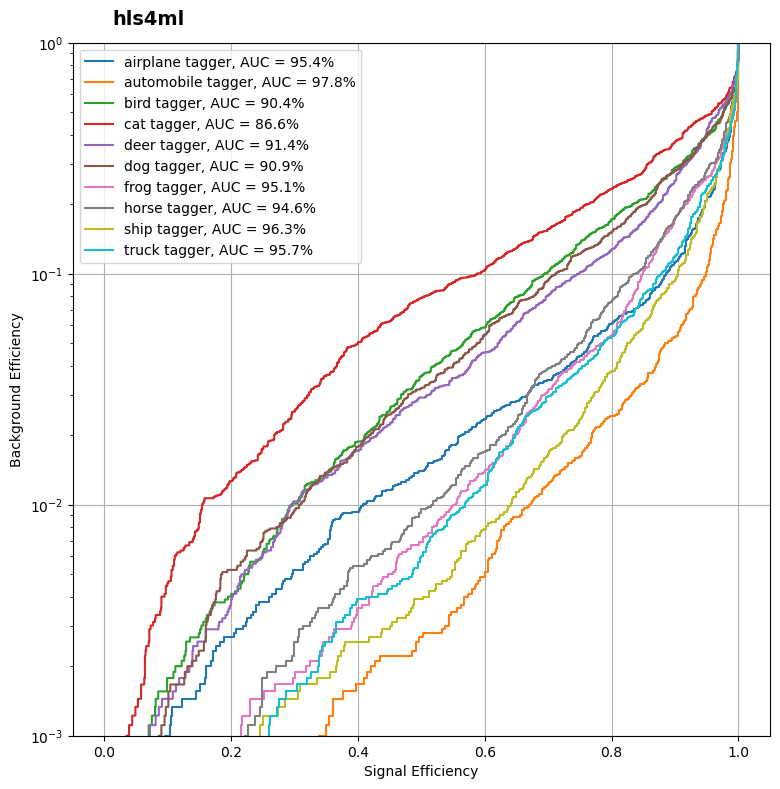

In [4]:
y_keras = keras_model.predict(x_test)
print("Accuracy :{}".format(accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_keras, axis=1))))

plt.figure(figsize=(9, 9))
_ = plotting.makeRoc(y_test, y_keras, cifar10_classes)


# Check sparsity

Layer conv_0: % of zeros = 0.0
Layer bn_conv_0: % of zeros = 0.0
Layer conv_1: % of zeros = 0.0
Layer bn_conv_1: % of zeros = 0.0
Layer conv_2: % of zeros = 0.0
Layer bn_conv_2: % of zeros = 0.0
Layer conv_3: % of zeros = 0.0
Layer bn_conv_3: % of zeros = 0.0
Layer conv_4: % of zeros = 0.0
Layer bn_conv_4: % of zeros = 0.0
Layer dense_0: % of zeros = 0.0
Layer bn_dense_0: % of zeros = 0.0
Layer dense_1: % of zeros = 0.0
Layer bn_dense_1: % of zeros = 0.0
Layer output_dense: % of zeros = 0.0


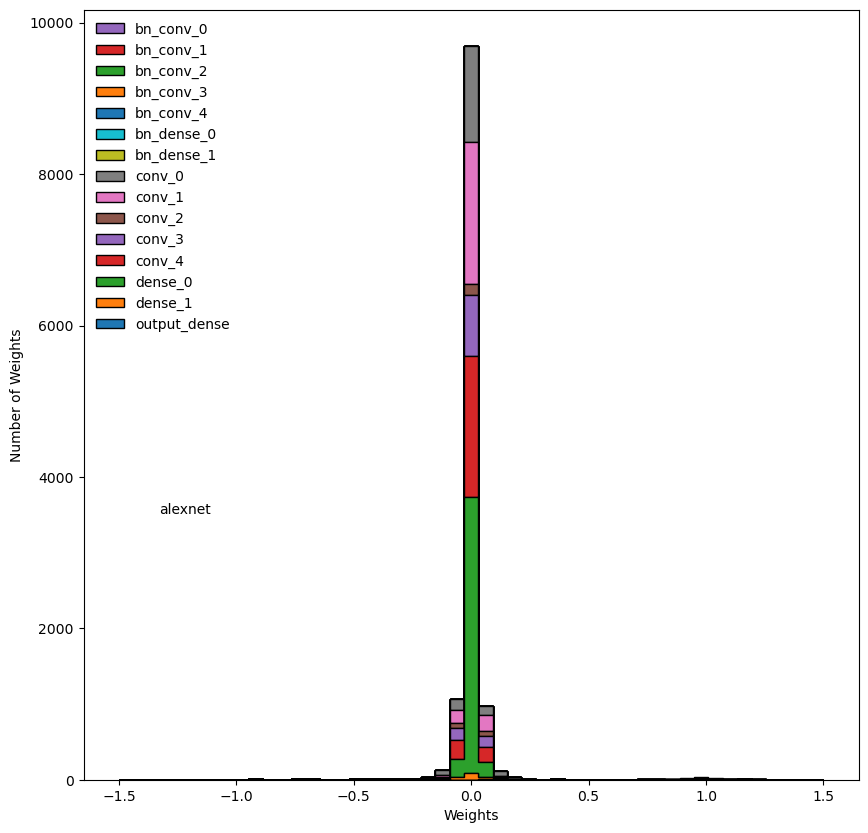

In [5]:
def doWeights(model):

    allWeightsByLayer = {}
    for layer in model.layers:
        if (layer._name).find("batch") != -1 or len(layer.get_weights()) < 1:
            continue
        weights = layer.weights[0].numpy().flatten()
        allWeightsByLayer[layer._name] = weights
        print('Layer {}: % of zeros = {}'.format(layer._name, np.sum(weights == 0) / np.size(weights)))

    labelsW = []
    histosW = []

    for key in reversed(sorted(allWeightsByLayer.keys())):
        labelsW.append(key)
        histosW.append(allWeightsByLayer[key])

    fig = plt.figure(figsize=(10, 10))
    bins = np.linspace(-1.5, 1.5, 50)
    plt.hist(histosW, bins, histtype='stepfilled', stacked=True, label=labelsW, edgecolor='black')
    plt.legend(frameon=False, loc='upper left')
    plt.ylabel('Number of Weights')
    plt.xlabel('Weights')
    plt.figtext(0.2, 0.38, model._name, wrap=True, horizontalalignment='left', verticalalignment='center')


doWeights(keras_model)
#doWeights(qkeras_model_8)
#doWeights(qkeras_model_16)

# Hls4ml Part

In [6]:
keras_hls_config = hls4ml.utils.config_from_keras_model(keras_model, granularity='name')

keras_hls_config['Model']['Precision'] = 'ap_fixed<16,6>'
keras_hls_config['Model']['ReuseFactor'] = 1

for Layer in keras_hls_config['LayerName'].keys():
    keras_hls_config['LayerName'][Layer]['Strategy'] = 'Latency'
    keras_hls_config['LayerName'][Layer]['ReuseFactor'] = 1
# If you want best numerical performance for high-accuray models, while the default latency strategy is faster but numerically more unstable
keras_hls_config['LayerName']['output_softmax']['Strategy'] = 'Stable'
plotting.print_dict(keras_hls_config)

cfg = hls4ml.converters.create_config(backend='Vitis')
cfg['IOType'] = 'io_stream'  # Must set this if using CNNs!
cfg['HLSConfig'] = keras_hls_config
cfg['KerasModel'] = keras_model
cfg['OutputDir'] = 'AlexNet_Cifar10_Keras'
cfg['ProjectName'] = 'AlexNet_Cifar10_Keras'
cfg['Part'] = 'xczu7ev-ffvc1156-2-e'
print(cfg)
keras_hls_model = hls4ml.converters.keras_to_hls(cfg)
keras_hls_model.compile()

Interpreting Model
Topology:
Layer name: input_1, layer type: InputLayer, input shapes: [[None, 32, 32, 3]], output shape: [None, 32, 32, 3]
Layer name: conv_0, layer type: Conv2D, input shapes: [[None, 32, 32, 3]], output shape: [None, 32, 32, 64]
Layer name: bn_conv_0, layer type: BatchNormalization, input shapes: [[None, 32, 32, 64]], output shape: [None, 32, 32, 64]
Layer name: conv_act_0, layer type: Activation, input shapes: [[None, 32, 32, 64]], output shape: [None, 32, 32, 64]
Layer name: pool_0, layer type: MaxPooling2D, input shapes: [[None, 32, 32, 64]], output shape: [None, 16, 16, 64]
Layer name: conv_1, layer type: Conv2D, input shapes: [[None, 16, 16, 64]], output shape: [None, 16, 16, 4]
Layer name: bn_conv_1, layer type: BatchNormalization, input shapes: [[None, 16, 16, 4]], output shape: [None, 16, 16, 4]
Layer name: conv_act_1, layer type: Activation, input shapes: [[None, 16, 16, 4]], output shape: [None, 16, 16, 4]
Layer name: pool_1, layer type: MaxPooling2D, inpu

Done


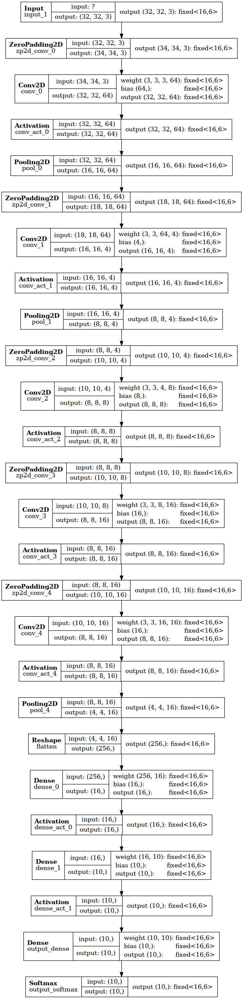

In [7]:
hls4ml.utils.plot_model(
    keras_hls_model,
    show_shapes=True,
    show_precision=True,
    to_file=None
)

Interpreting Model
Topology:
Layer name: input_1, layer type: InputLayer, input shapes: [[None, 32, 32, 3]], output shape: [None, 32, 32, 3]
Layer name: conv_0, layer type: Conv2D, input shapes: [[None, 32, 32, 3]], output shape: [None, 32, 32, 64]
Layer name: bn_conv_0, layer type: BatchNormalization, input shapes: [[None, 32, 32, 64]], output shape: [None, 32, 32, 64]
Layer name: conv_act_0, layer type: Activation, input shapes: [[None, 32, 32, 64]], output shape: [None, 32, 32, 64]
Layer name: pool_0, layer type: MaxPooling2D, input shapes: [[None, 32, 32, 64]], output shape: [None, 16, 16, 64]
Layer name: conv_1, layer type: Conv2D, input shapes: [[None, 16, 16, 64]], output shape: [None, 16, 16, 4]
Layer name: bn_conv_1, layer type: BatchNormalization, input shapes: [[None, 16, 16, 4]], output shape: [None, 16, 16, 4]
Layer name: conv_act_1, layer type: Activation, input shapes: [[None, 16, 16, 4]], output shape: [None, 16, 16, 4]
Layer name: pool_1, layer type: MaxPooling2D, inpu

(<Figure size 640x480 with 1 Axes>,
 <Figure size 640x480 with 1 Axes>,
 None,
 None)

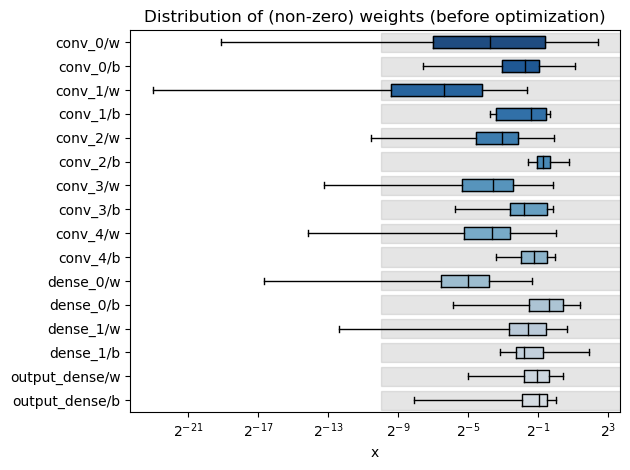

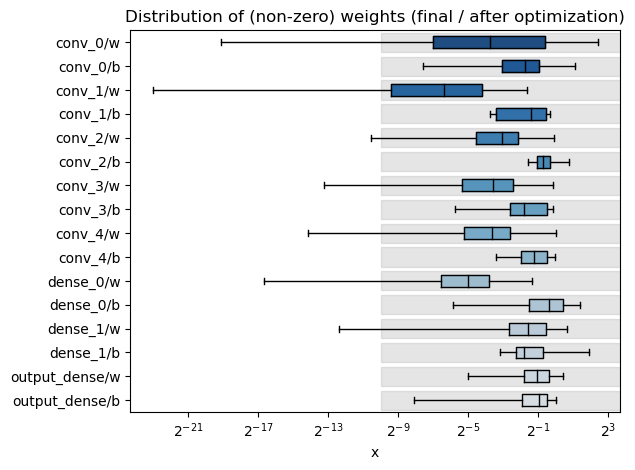

In [8]:
hls4ml.model.profiling.numerical(
    model = keras_model,
    hls_model = keras_hls_model
)

313/313 [==============================] - 2s 8ms/step
Keras  Accuracy: 0.6402
hls4ml Accuracy: 0.6378


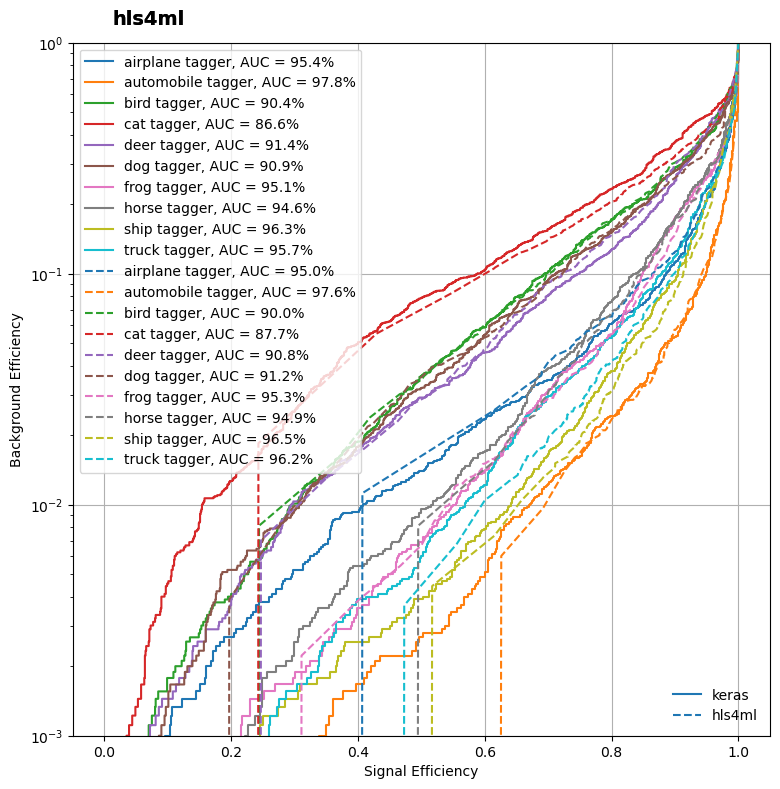

In [9]:
y_predict = keras_model.predict(x_test)
y_predict_hls4ml = keras_hls_model.predict(np.ascontiguousarray(x_test))
print("Keras  Accuracy: {}".format(accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_predict, axis=1))))
print("hls4ml Accuracy: {}".format(accuracy_score(np.argmax(y_test, axis=1), np.argmax(y_predict_hls4ml, axis=1))))

fig, ax = plt.subplots(figsize=(9, 9))
_ = plotting.makeRoc(y_test, y_predict, cifar10_classes)
plt.gca().set_prop_cycle(None)  # reset the colors
_ = plotting.makeRoc(y_test, y_predict_hls4ml, cifar10_classes, linestyle='--')

from matplotlib.lines import Line2D

lines = [Line2D([0], [0], ls='-'), Line2D([0], [0], ls='--')]
from matplotlib.legend import Legend

leg = Legend(ax, lines, labels=['keras', 'hls4ml'], loc='lower right', frameon=False)
ax.add_artist(leg)

In [24]:
import os
os.environ["TCL_NUM_THREADS"] = "16"

In [25]:
keras_hls_model.build(
    csim=False,
    synth=True,
    vsynth=True,
    export=True
)


****** Vitis HLS - High-Level Synthesis from C, C++ and OpenCL v2022.1 (64-bit)
  **** SW Build 3526262 on Mon Apr 18 15:47:01 MDT 2022
  **** IP Build 3524634 on Mon Apr 18 20:55:01 MDT 2022
    ** Copyright 1986-2022 Xilinx, Inc. All Rights Reserved.

source /data/Ao_XIE/vivado/Vitis_HLS/2022.1/scripts/vitis_hls/hls.tcl -notrace
INFO: [HLS 200-10] Running '/data/Ao_XIE/vivado/Vitis_HLS/2022.1/bin/unwrapped/lnx64.o/vitis_hls'
INFO: [HLS 200-10] For user 'lab-shi' on host 'labshi-MP-i1640' (Linux_x86_64 version 4.15.0-212-generic) on Tue Jun 13 19:12:11 JST 2023
INFO: [HLS 200-10] On os Ubuntu 18.04.6 LTS
INFO: [HLS 200-10] In directory '/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras'
Sourcing Tcl script 'build_prj.tcl'
INFO: [HLS 200-1510] Running: open_project AlexNet_Cifar10_Keras_prj 
INFO: [HLS 200-10] Opening project '/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj'.
INFO: [HLS 200-1510] Running: set_

INFO: [HLS 200-111] Finished Source Code Analysis and Preprocessing: CPU user time: 19.63 seconds. CPU system time: 0.67 seconds. Elapsed time: 19.69 seconds; current allocated memory: 131.578 MB.
INFO: [HLS 200-777] Using interface defaults for 'Vivado' flow target.
INFO: [HLS 214-131] Inlining function 'void nnet::fill_zero<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, config37>(hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, 0>&)' into 'void nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, config37>(hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, 0>&, hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, 0>&)' (firmware/nnet_utils/nnet_padding_stream.h:54:13)
INFO: [HLS 214-131] Inlining function 'void nnet::fill_zero<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, conf

INFO: [HLS 214-186] Unrolling loop 'VITIS_LOOP_213_1' (firmware/nnet_utils/nnet_activation_stream.h:213:27) in function 'nnet::softmax_stable<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, softmax_config36>' completely with a factor of 10 (firmware/nnet_utils/nnet_activation_stream.h:170:0)
INFO: [HLS 214-186] Unrolling loop 'anonymous' (firmware/nnet_utils/nnet_activation_stream.h:219:40) in function 'nnet::softmax_stable<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, softmax_config36>' completely with a factor of 10 (firmware/nnet_utils/nnet_activation_stream.h:170:0)
INFO: [HLS 214-186] Unrolling loop 'VITIS_LOOP_222_2' (firmware/nnet_utils/nnet_activation_stream.h:222:27) in function 'nnet::softmax_stable<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap

INFO: [HLS 214-186] Unrolling loop 'CastLoop' (firmware/nnet_utils/nnet_conv_stream.h:303:9) in function 'nnet::conv_2d_buffer_latency_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config20>' completely with a factor of 16 (firmware/nnet_utils/nnet_conv2d_stream.h:16:0)
INFO: [HLS 214-186] Unrolling loop 'Result' (firmware/nnet_utils/nnet_dense_latency.h:64:5) in function 'nnet::dense_latency<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config20_mult>' completely with a factor of 16 (firmware/nnet_utils/nnet_dense_latency.h:15:0)
INFO: [HLS 214-186] Unrolling loop 'Accum1' (firmware/nnet_utils/nnet_dense_latency.h:54:5) in function 'nnet::dense_latency<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config20_mult>' completely with a factor of 144 (firmware/nnet_utils/nnet_dense_latency.h:15:0)
INFO: [

INFO: [HLS 214-186] Unrolling loop 'VITIS_LOOP_22_1' (firmware/nnet_utils/nnet_padding_stream.h:22:22) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 8u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 8u>, config40>' completely with a factor of 8 (firmware/nnet_utils/nnet_padding_stream.h:48:0)
INFO: [HLS 214-186] Unrolling loop 'ReLUPackLoop' (firmware/nnet_utils/nnet_activation_stream.h:49:9) in function 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 8u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 8u>, relu_config15>' completely with a factor of 8 (firmware/nnet_utils/nnet_activation_stream.h:39:0)
INFO: [HLS 214-186] Unrolling loop 'anonymous' (firmware/nnet_utils/nnet_conv_stream.h:276:40) in function 'nnet::conv_2d_buffer_latency_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 8u>, config12>' completely

INFO: [HLS 214-186] Unrolling loop 'anonymous' (firmware/nnet_utils/nnet_conv_stream.h:229:30) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4u>, config11>' completely with a factor of 2 (firmware/nnet_utils/nnet_conv_stream.h:224:0)
INFO: [HLS 214-186] Unrolling loop 'anonymous' (firmware/nnet_utils/nnet_conv_stream.h:229:30) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4u>, config11>' completely with a factor of 4 (firmware/nnet_utils/nnet_conv_stream.h:224:0)
INFO: [HLS 214-186] Unrolling loop 'ReLUPackLoop' (firmware/nnet_utils/nnet_activation_stream.h:49:9) in function 'nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4u>, relu_config10>' completely with a factor of 4 (firmware/nnet_utils/nnet_activation_stream.h:39:0)
INFO: [HLS 214-186] Unrolling loop 'anonymous' (firmware/nnet_utils/nnet_con

INFO: [HLS 214-186] Unrolling loop 'KernelPushChannel' (firmware/nnet_utils/nnet_conv_stream.h:213:9) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config6>' completely with a factor of 64 (firmware/nnet_utils/nnet_conv_stream.h:224:0)
INFO: [HLS 214-186] Unrolling loop 'KernelShiftWidth' (firmware/nnet_utils/nnet_conv_stream.h:194:5) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config6>' completely with a factor of 1 (firmware/nnet_utils/nnet_conv_stream.h:224:0)
INFO: [HLS 214-186] Unrolling loop 'KernelShiftHeight' (firmware/nnet_utils/nnet_conv_stream.h:197:9) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config6>' completely with a factor of 2 (firmware/nnet_utils/nnet_conv_stream.h:224:0)
INFO: [HLS 214-186] Unrolling loop 'KernelShiftChannel' (firmware/nnet_utils/nnet_conv_stream.h:199:13) in function 'nnet::s

INFO: [HLS 214-186] Unrolling loop 'anonymous' (firmware/nnet_utils/nnet_conv_stream.h:229:30) in function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, config2>' completely with a factor of 3 (firmware/nnet_utils/nnet_conv_stream.h:224:0)
INFO: [HLS 214-186] Unrolling loop 'VITIS_LOOP_22_1' (firmware/nnet_utils/nnet_padding_stream.h:22:22) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, config37>' completely with a factor of 3 (firmware/nnet_utils/nnet_padding_stream.h:48:0)
INFO: [HLS 214-178] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>::operator[](unsigned long)' into 'void nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, config37>(hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_

INFO: [HLS 214-178] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>::operator[](unsigned long)' into 'void nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config41>(hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, 0>&, hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, 0>&)' (firmware/nnet_utils/nnet_padding_stream.h:48:0)
INFO: [HLS 214-178] Inlining function 'nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>::operator[](unsigned long) const' into 'void nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config20>(nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u> const&, ap_shift_reg<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>::value_type, config20::in_width> (*) [config20::n_chan], nnet::array<ap_fixed<16

INFO: [HLS 214-178] Inlining function 'nnet::Op_add<ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0> >::operator()(ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0>, ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0>) (.193.214.220.228)' into 'ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0> nnet::reduce<ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0>, 8, nnet::Op_add<ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0> > >(ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0> const*, nnet::Op_add<ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0> >)' (firmware/nnet_utils/nnet_common.h:36:0)
INFO: [HLS 214-178] Inlining function 'ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0> nnet::reduce<ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0>, 8, nnet::Op_add<ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0> > >(ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0> const*, nnet::Op_add<ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0> >)' into 'ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0> nnet::reduce<ap_fixed<18, 8, (ap_q_mode)0, (

INFO: [HLS 214-248] Applying array_partition to '_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj16EEES6_8config20EEvRKT_PAsrT1_6n_chan_12ap_shift_regINS8_10value_typeEXsrSB_8in_widthEERN3hls6streamIT0_Li0EEEPNSB_8weight_tEPNSB_6bias_tEE11kernel_data': Complete partitioning on dimension 1. (firmware/nnet_utils/nnet_conv_stream.h:276:0)
INFO: [HLS 214-248] Applying array_partition to '_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj8EEENS1_IS5_Lj16EEE8config16EEvRKT_PAsrT1_6n_chan_12ap_shift_regINS9_10value_typeEXsrSC_8in_widthEERN3hls6streamIT0_Li0EEEPNSC_8weight_tEPNSC_6bias_tEE11kernel_data': Complete partitioning on dimension 1. (firmware/nnet_utils/nnet_conv_stream.h:276:0)
INFO: [HLS 214-248] Applying array_partition to '_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj4EEENS1_IS5_Lj8EEE8config12EEvRKT_PAsrT1_6n_chan_12ap_shift_regINS

INFO: [HLS 214-241] Aggregating bram variable 'void nnet::pooling2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config6>(hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, 0>&, hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, 0>&)::line_buffer' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet12pooling2d_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEES6_7config6EEvRN3hls6streamIT_Li0EEERNS9_IT0_Li0EEEE11line_buffer_10' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet12pooling2d_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEES6_7config6EEvRN3hls6streamIT_Li0EEERNS9_IT0_Li0EEEE11line_buffer_11' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet12pooling2d_clINS_5arrayI8ap_fixedILi

INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet12pooling2d_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEES6_7config6EEvRN3hls6streamIT_Li0EEERNS9_IT0_Li0EEEE11line_buffer_51' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet12pooling2d_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEES6_7config6EEvRN3hls6streamIT_Li0EEERNS9_IT0_Li0EEEE11line_buffer_52' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet12pooling2d_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEES6_7config6EEvRN3hls6streamIT_Li0EEERNS9_IT0_Li0EEEE11line_buffer_53' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet12pooling2d_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEES6_7config6EEvRN3hls6streamIT_Li0EEERNS9_IT0_Li0EEEE11line_buffer_54' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram

INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEENS1_IS5_Lj4EEE7config7EEvRN3hls6streamIT_Li0EEERNSA_IT0_Li0EEEPNT1_8weight_tEPNSH_6bias_tEE11line_buffer_0_26' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEENS1_IS5_Lj4EEE7config7EEvRN3hls6streamIT_Li0EEERNSA_IT0_Li0EEEPNT1_8weight_tEPNSH_6bias_tEE11line_buffer_0_27' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEENS1_IS5_Lj4EEE7config7EEvRN3hls6streamIT_Li0EEERNSA_IT0_Li0EEEPNT1_8weight_tEPNSH_6bias_tEE11line_buffer_0_28' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9

INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEENS1_IS5_Lj4EEE7config7EEvRN3hls6streamIT_Li0EEERNSA_IT0_Li0EEEPNT1_8weight_tEPNSH_6bias_tEE11line_buffer_0_63' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEENS1_IS5_Lj4EEE7config7EEvRN3hls6streamIT_Li0EEERNSA_IT0_Li0EEEPNT1_8weight_tEPNSH_6bias_tEE11line_buffer_1_0' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEENS1_IS5_Lj4EEE7config7EEvRN3hls6streamIT_Li0EEERNSA_IT0_Li0EEEPNT1_8weight_tEPNSH_6bias_tEE11line_buffer_1_1' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap

INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEENS1_IS5_Lj4EEE7config7EEvRN3hls6streamIT_Li0EEERNSA_IT0_Li0EEEPNT1_8weight_tEPNSH_6bias_tEE11line_buffer_1_34' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEENS1_IS5_Lj4EEE7config7EEvRN3hls6streamIT_Li0EEERNSA_IT0_Li0EEEPNT1_8weight_tEPNSH_6bias_tEE11line_buffer_1_35' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj64EEENS1_IS5_Lj4EEE7config7EEvRN3hls6streamIT_Li0EEERNSA_IT0_Li0EEEPNT1_8weight_tEPNSH_6bias_tEE11line_buffer_1_36' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9

INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj4EEENS1_IS5_Lj8EEE8config12EEvRN3hls6streamIT_Li0EEERNSA_IT0_Li0EEEPNT1_8weight_tEPNSH_6bias_tEE11line_buffer_0_3' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj4EEENS1_IS5_Lj8EEE8config12EEvRN3hls6streamIT_Li0EEERNSA_IT0_Li0EEEPNT1_8weight_tEPNSH_6bias_tEE11line_buffer_1_0' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj4EEENS1_IS5_Lj8EEE8config12EEvRN3hls6streamIT_Li0EEERNSA_IT0_Li0EEEPNT1_8weight_tEPNSH_6bias_tEE11line_buffer_1_1' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_

INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj16EEES6_8config20EEvRN3hls6streamIT_Li0EEERNS9_IT0_Li0EEEPNT1_8weight_tEPNSG_6bias_tEE11line_buffer_0_11' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj16EEES6_8config20EEvRN3hls6streamIT_Li0EEERNS9_IT0_Li0EEEPNT1_8weight_tEPNSG_6bias_tEE11line_buffer_0_12' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EELj16EEES6_8config20EEvRN3hls6streamIT_Li0EEERNS9_IT0_Li0EEEPNT1_8weight_tEPNSG_6bias_tEE11line_buffer_0_13' with compact=bit mode in 16-bits
INFO: [HLS 214-241] Aggregating bram variable '_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3ELi0EEL

INFO: [HLS 214-131] Inlining function '_llvm.fpga.pack.bits.i1024.s_struct.nnet::array<ap_fixed<16, 6, AP_TRN, AP_WRAP, 0>, 64>s.1' into 'void nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config38>(hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, 0>&, hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, 0>&) (.1)' (/data/Ao_XIE/vivado/Vitis_HLS/2022.1/common/technology/autopilot/hls_stream_39.h:174:9)
INFO: [HLS 214-131] Inlining function '_llvm.fpga.unpack.bits.s_struct.nnet::array<ap_fixed<16, 6, AP_TRN, AP_WRAP, 0>, 64>s.i1024.1' into 'void nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config38>(hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, 0>&, hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_

INFO: [HLS 214-131] Inlining function '_llvm.fpga.pack.bits.i256.s_struct.nnet::array<ap_fixed<16, 6, AP_TRN, AP_WRAP, 0>, 16>s.1' into 'void nnet::conv_2d_buffer_latency_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 8u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config16>(hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 8u>, 0>&, hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, 0>&, config16::weight_t*, config16::bias_t*) (.1)' (/data/Ao_XIE/vivado/Vitis_HLS/2022.1/common/technology/autopilot/hls_stream_39.h:174:9)
INFO: [HLS 214-131] Inlining function '_llvm.fpga.pack.none.i256.s_struct.nnet::array<ap_fixed<16, 6, AP_TRN, AP_WRAP, 0>, 16>s' into 'void nnet::conv_2d_buffer_latency_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 8u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config16>(hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 

INFO: [HLS 214-131] Inlining function '_llvm.fpga.pack.none.i160.a10s_struct.ap_fixed<16, 6, AP_TRN, AP_WRAP, 0>s' into '_llvm.fpga.unpack.bits.s_struct.nnet::array<ap_fixed<16, 6, AP_TRN, AP_WRAP, 0>, 10>s.i160.1'
INFO: [HLS 214-131] Inlining function '_llvm.fpga.unpack.bits.s_struct.nnet::array<ap_fixed<16, 6, AP_TRN, AP_WRAP, 0>, 10>s.i160.1' into 'void nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, relu_config33>(hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, 0>&, hls::stream<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, 0>&) (.1)' (/data/Ao_XIE/vivado/Vitis_HLS/2022.1/common/technology/autopilot/hls_stream_39.h:145:9)
INFO: [HLS 214-131] Inlining function '_llvm.fpga.pack.bits.i160.s_struct.nnet::array<ap_fixed<16, 6, AP_TRN, AP_WRAP, 0>, 10>s.1' into 'void nnet::relu<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, nne

INFO: [XFORM 203-603] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config2_mult>' into 'nnet::conv_2d_buffer_latency_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config2>' (firmware/nnet_utils/nnet_dense_latency.h:66->firmware/nnet_utils/nnet_conv_stream.h:294).
INFO: [XFORM 203-603] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config2_mult>' into 'nnet::conv_2d_buffer_latency_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config2>' (firmware/nnet_utils/nnet_dense_latency.h:66->firmware/nnet_utils/nnet_conv_stream.h:294).
INFO: [XFORM 203-603] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_

INFO: [XFORM 203-603] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config2_mult>' into 'nnet::conv_2d_buffer_latency_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config2>' (firmware/nnet_utils/nnet_dense_latency.h:66->firmware/nnet_utils/nnet_conv_stream.h:294).
INFO: [XFORM 203-603] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config2_mult>' into 'nnet::conv_2d_buffer_latency_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config2>' (firmware/nnet_utils/nnet_dense_latency.h:66->firmware/nnet_utils/nnet_conv_stream.h:294).
INFO: [XFORM 203-603] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_

INFO: [XFORM 203-603] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config2_mult>' into 'nnet::conv_2d_buffer_latency_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config2>' (firmware/nnet_utils/nnet_dense_latency.h:66->firmware/nnet_utils/nnet_conv_stream.h:294).
INFO: [XFORM 203-603] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, config2_mult>' into 'nnet::conv_2d_buffer_latency_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 3u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config2>' (firmware/nnet_utils/nnet_dense_latency.h:66->firmware/nnet_utils/nnet_conv_stream.h:294).
INFO: [XFORM 203-603] Inlining function 'nnet::cast<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, ap_fixed<16, 6, (ap_q_mode)5, (ap_

INFO: [XFORM 203-603] Inlining function 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4, nnet::Op_max<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0> > >' into 'nnet::pooling2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config6>' (firmware/nnet_utils/nnet_pooling_stream.h:21).
INFO: [XFORM 203-603] Inlining function 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4, nnet::Op_max<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0> > >' into 'nnet::pooling2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config6>' (firmware/nnet_utils/nnet_pooling_stream.h:21).
INFO: [XFORM 203-603] Inlining function 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4, nnet::Op_max<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0> > >' into 'nnet::pooling2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_m

INFO: [XFORM 203-603] Inlining function 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4, nnet::Op_max<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0> > >' into 'nnet::pooling2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config6>' (firmware/nnet_utils/nnet_pooling_stream.h:21).
INFO: [XFORM 203-603] Inlining function 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4, nnet::Op_max<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0> > >' into 'nnet::pooling2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config6>' (firmware/nnet_utils/nnet_pooling_stream.h:21).
INFO: [XFORM 203-603] Inlining function 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4, nnet::Op_max<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0> > >' into 'nnet::pooling2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_m

INFO: [XFORM 203-603] Inlining function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config7>' into 'nnet::conv_2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4u>, config7>' (firmware/nnet_utils/nnet_conv_stream.h:286).
INFO: [XFORM 203-603] Inlining function 'nnet::shift_line_buffer<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4u>, config11>' into 'nnet::pooling2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4u>, config11>' (firmware/nnet_utils/nnet_pooling_stream.h:52).
INFO: [XFORM 203-603] Inlining function 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4, nnet::Op_max<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0> > >' into 'nnet::pooling2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4u>, nnet::array<ap_fixed<16, 6, (ap_q_

INFO: [XFORM 203-603] Inlining function 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4, nnet::Op_max<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0> > >' into 'nnet::pooling2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config24>' (firmware/nnet_utils/nnet_pooling_stream.h:21).
INFO: [XFORM 203-603] Inlining function 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4, nnet::Op_max<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0> > >' into 'nnet::pooling2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 16u>, config24>' (firmware/nnet_utils/nnet_pooling_stream.h:21).
INFO: [XFORM 203-603] Inlining function 'nnet::reduce<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4, nnet::Op_max<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0> > >' into 'nnet::pooling2d_cl<nnet::array<ap_fixed<16, 6, (ap_q

INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'PadMain' (firmware/nnet_utils/nnet_padding_stream.h:59) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 8u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 8u>, config40>' for pipelining.
INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'PadMain' (firmware/nnet_utils/nnet_padding_stream.h:59) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 64u>, config38>' for pipelining.
INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'PadMain' (firmware/nnet_utils/nnet_padding_stream.h:59) in function 'nnet::zeropad2d_cl<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 4u>, config39>' for pipelining.
INFO: [XFORM 203-502] Unrolling all sub-loops inside loop 'PadMain' (firmware/nnet_uti

INFO: [XFORM 203-401] Performing if-conversion on hyperblock to (firmware/nnet_utils/nnet_activation_stream.h:248:1) in function 'nnet::softmax_stable<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, softmax_config36>'... converting 3 basic blocks.
INFO: [XFORM 203-401] Performing if-conversion on hyperblock to (firmware/nnet_utils/nnet_common.h:45:5) in function 'nnet::reduce<ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0>, 4, nnet::Op_add<ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0> > >'... converting 3 basic blocks.
INFO: [XFORM 203-602] Inlining function 'nnet::reduce<ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0>, 4, nnet::Op_add<ap_fixed<18, 8, (ap_q_mode)0, (ap_o_mode)0, 0> > >' into 'nnet::softmax_stable<nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, nnet::array<ap_fixed<16, 6, (ap_q_mode)5, (ap_o_mode)3, 0>, 10u>, softmax_config36>' (firmware/nnet_utils/nnet_common.h:45) auto

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'zeropad2d_cl_array_array_ap_fixed_16_6_5_3_0_3u_config37_Pipeline_PadTopWidth' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'PadTopWidth'.
INFO: [HLS 200-1470] Pipelining result : Target II = NA, Final II = 1, Depth = 2, loop 'PadTopWidth'
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111] Finished Scheduling: CPU user time: 7.2 seconds. CPU system time: 0.11 seconds. Elapsed time: 7.31 seconds; current allocated memory: 1.742 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111] Finished Binding: 

Resolution: For help on HLS 200-880 see www.xilinx.com/cgi-bin/docs/rdoc?v=2022.1;t=hls+guidance;d=200-880.html
Resolution: For help on HLS 200-880 see www.xilinx.com/cgi-bin/docs/rdoc?v=2022.1;t=hls+guidance;d=200-880.html
Resolution: For help on HLS 200-880 see www.xilinx.com/cgi-bin/docs/rdoc?v=2022.1;t=hls+guidance;d=200-880.html
Resolution: For help on HLS 200-880 see www.xilinx.com/cgi-bin/docs/rdoc?v=2022.1;t=hls+guidance;d=200-880.html
INFO: [HLS 200-1470] Pipelining result : Target II = NA, Final II = 34, Depth = 35, loop 'PadMain'
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111] Finished Scheduling: CPU user time: 1.16 seconds. CPU system time: 0.01 seconds. Elapsed time: 1.18 seconds; current allocated memory: 1.744 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-arch

INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111] Finished Binding: CPU user time: 0.51 seconds. CPU system time: 0 seconds. Elapsed time: 0.51 seconds; current allocated memory: 2.144 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'ReadInputHeight_ReadInputWidth'.
INFO: [HLS 200-1470] Pipelining result : Target II = NA, Final II = 1, Depth = 3, loop 'ReadInputHeight_ReadInputWidth'
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111] Finished Scheduling: CPU user time: 2.24 seconds. CPU system time: 0.01 seconds. Elapsed time: 2.24 seconds; current allocated memory: 2.144 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
I

INFO: [HLS 200-111] Finished Scheduling: CPU user time: 0.65 seconds. CPU system time: 0.01 seconds. Elapsed time: 0.66 seconds; current allocated memory: 2.144 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111] Finished Binding: CPU user time: 0.27 seconds. CPU system time: 0 seconds. Elapsed time: 0.27 seconds; current allocated memory: 2.144 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'zeropad2d_cl_array_array_ap_fixed_64u_config38_Pipeline_PadBottomWidth' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'PadBottomWidth'.
INFO: [HLS 200-1470] Pipe

Resolution: For help on HLS 200-880 see www.xilinx.com/cgi-bin/docs/rdoc?v=2022.1;t=hls+guidance;d=200-880.html
Resolution: For help on HLS 200-880 see www.xilinx.com/cgi-bin/docs/rdoc?v=2022.1;t=hls+guidance;d=200-880.html
Resolution: For help on HLS 200-880 see www.xilinx.com/cgi-bin/docs/rdoc?v=2022.1;t=hls+guidance;d=200-880.html
INFO: [HLS 200-1470] Pipelining result : Target II = NA, Final II = 10, Depth = 11, loop 'PadMain'
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111] Finished Scheduling: CPU user time: 0.46 seconds. CPU system time: 0.01 seconds. Elapsed time: 0.47 seconds; current allocated memory: 2.586 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111] Finished Binding: CPU user time: 0.21 seconds. CPU system time: 0 secon

INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111] Finished Binding: CPU user time: 0.14 seconds. CPU system time: 0.01 seconds. Elapsed time: 0.15 seconds; current allocated memory: 2.586 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'zeropad2d_cl_array_array_ap_fixed_16_6_5_3_0_8u_config40_Pipeline_PadMain' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'PadMain'.
Resolution: For help on HLS 200-880 see www.xilinx.com/cgi-bin/docs/rdoc?v=2022.1;t=hls+guidance;d=200-880.html
Resolution: For help on HLS 200-880 see www.xilinx.com/cgi-bin/docs/rdoc?v=2022.1;t=hls+guidance;d=200-880.html
Resolution: For help on HLS 200

INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111] Finished Binding: CPU user time: 0.19 seconds. CPU system time: 0 seconds. Elapsed time: 0.2 seconds; current allocated memory: 2.586 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'ReadInputHeight_ReadInputWidth'.
INFO: [HLS 200-1470] Pipelining result : Target II = 1, Final II = 1, Depth = 5, loop 'ReadInputHeight_ReadInputWidth'
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111] Finished Scheduling: CPU user time: 15.12 seconds. CPU syst

INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111] Finished Scheduling: CPU user time: 0.49 seconds. CPU system time: 0 seconds. Elapsed time: 0.49 seconds; current allocated memory: 2.586 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111] Finished Binding: CPU user time: 0.23 seconds. CPU system time: 0 seconds. Elapsed time: 0.23 seconds; current allocated memory: 2.586 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'zeropad2d_cl_array_array_ap_fixed_16u_config41_Pipeline_PadBottomWidth' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-61] Pipelining loop 'Pad

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-42] -- Implementing module 'relu_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_relu_config29_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [SCHED 204-11] Starting scheduling ...
INFO: [SCHED 204-11] Finished scheduling.
INFO: [HLS 200-111] Finished Scheduling: CPU user time: 50.69 seconds. CPU system time: 0.08 seconds. Elapsed time: 51.05 seconds; current allocated memory: 4.340 GB.
INFO: [BIND 205-100] Starting micro-architecture generation ...
INFO: [BIND 205-101] Performing variable lifetime analysis.
INFO: [BIND 205-101] Exploring resource sharing.
INFO: [BIND 205-101] Binding ...
INFO: [BIND 205-100] Finished micro-architecture generation.
INFO: [HLS 200-111] Finished Binding: CPU user time: 0.23 seconds. CPU system time: 0 seconds. Elapsed time: 0.23 seconds; current allocated memory: 4.340 GB.
INFO: [HLS 200-10] ------------------

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'zeropad2d_cl_array_array_ap_fixed_16_6_5_3_0_3u_config37_Pipeline_PadMain' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-1030] Apply Unified Pipeline Control on module 'zeropad2d_cl_array_array_ap_fixed_16_6_5_3_0_3u_config37_Pipeline_PadMain' pipeline 'PadMain' pipeline type 'loop pipeline'
INFO: [RTGEN 206-100] Finished creating RTL model for 'zeropad2d_cl_array_array_ap_fixed_16_6_5_3_0_3u_config37_Pipeline_PadMain'.
INFO: [HLS 200-111] Finished Creating RTL model: CPU user time: 0.26 seconds. CPU system time: 0.01 seconds. Elapsed time: 0.27 seconds; current allocated memory: 4.340 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'zeropad2d_cl_array_array_ap_fixed_3u_config37_Pipeline_PadBottomWidth' 
INFO: [HLS 

INFO: [RTGEN 206-104] Estimated max fanout for 'conv_2d_cl_array_ap_fixed_3u_array_ap_fixed_16_6_5_3_0_64u_config2_s' is 29183 from HDL expression: ((1'b0 == ap_block_pp0_stage0) & (ap_enable_reg_pp0_iter2 == 1'b1))
INFO: [RTGEN 206-100] Generating core module 'mul_16s_10ns_26_1_1': 75 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_10s_26_1_1': 77 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_11ns_26_1_1': 73 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_11s_26_1_1': 89 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_12ns_26_1_1': 85 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_12s_26_1_1': 84 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_13ns_26_1_1': 67 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_13s_26_1_1': 69 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_14ns_26_1_1': 8 instance(s).
INFO: [RTGEN 206-100] Generating 

INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_void_pooling2d_cl_stream_stream_array_ap_fixed_64u_0_line_buffer_9_SHIFTREG_AUTO_0R0W' to 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_void_pooling2d_cl_hbi' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_void_pooling2d_cl_stream_stream_array_ap_fixed_64u_0_line_buffer_8_SHIFTREG_AUTO_0R0W' to 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_void_pooling2d_cl_ibs' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_void_pooling2d_cl_stream_stream_array_ap_fixed_64u_0_line_buffer_7_SHIFTREG_AUTO_0R0W' to 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_void_pooling2d_cl_jbC' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_

INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_p_ZZN4nnet12pooling2d_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3EL_51_SHIFTREG_AUTO_0R0W' to 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_p_ZZN4nnet12poolintde' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_p_ZZN4nnet12pooling2d_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3EL_50_SHIFTREG_AUTO_0R0W' to 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_p_ZZN4nnet12poolinudo' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_p_ZZN4nnet12pooling2d_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3EL_49_SHIFTREG_AUTO_0R0W' to 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_p_ZZN4nnet12poolinvdy' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooli

INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_p_ZZN4nnet12pooling2d_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3EL_23_SHIFTREG_AUTO_0R0W' to 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_p_ZZN4nnet12poolinVhK' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_p_ZZN4nnet12pooling2d_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3EL_22_SHIFTREG_AUTO_0R0W' to 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_p_ZZN4nnet12poolinWhU' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_p_ZZN4nnet12pooling2d_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9ap_o_mode3EL_21_SHIFTREG_AUTO_0R0W' to 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config6_s_p_ZZN4nnet12poolinXh4' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooli

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'zeropad2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config38_Pipeline_PadMain' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-1030] Apply Unified Pipeline Control on module 'zeropad2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config38_Pipeline_PadMain' pipeline 'PadMain' pipeline type 'loop pipeline'
INFO: [RTGEN 206-100] Finished creating RTL model for 'zeropad2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config38_Pipeline_PadMain'.
INFO: [HLS 200-111] Finished Creating RTL model: CPU user time: 0.36 seconds. CPU system time: 0.01 seconds. Elapsed time: 0.37 seconds; current allocated memory: 4.340 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'zeropad2d_cl_array_array_ap_fixed_64u_config38_Pipeline_PadBottomWidth' 
INFO: [

INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_235_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnbjl' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_79_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnbkl' due to the length limit 80


INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_236_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnbll' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_78_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnbml' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_247_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnbnm' due to the length limit 80
INFO: [SYN 201

INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_74_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnbKp' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_241_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnbLp' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_73_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnbMq' due to the length limit 80
INFO: [SYN 201-

INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_254_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnb9t' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_60_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nncau' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_255_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nncbu' due to the length limit 80
INFO: [SYN 201

INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_47_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nncyx' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_268_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnczy' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_46_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nncAy' due to the length limit 80
INFO: [SYN 201-

INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_96_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nncXB' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_32_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nncYC' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_95_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nncZC' due to the length limit 80
INFO: [SYN 201-2

INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_19_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s_p_ZZN4nndmF' due to the length limit 80
INFO: [RTGEN 206-104] Estimated max fanout for 'conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s' is 23074 from HDL expression: ((ap_enable_reg_pp0_iter2 == 1'b1) & (1'b0 == ap_block_pp0_stage0))
INFO: [RTGEN 206-100] Generating core module 'mul_16s_10ns_26_1_1': 4 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_10s_26_1_1': 14 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_5ns_21_1_1': 22 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_5s_21_1_1': 27 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_6ns_22_1_1': 48 instance(s).
INFO: [RTGEN 206-100] Generating core modu

INFO: [HLS 200-111] Finished Creating RTL model: CPU user time: 0.55 seconds. CPU system time: 0.01 seconds. Elapsed time: 0.57 seconds; current allocated memory: 4.340 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'zeropad2d_cl_array_ap_fixed_4u_array_ap_fixed_16_6_5_3_0_4u_config39_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-100] Finished creating RTL model for 'zeropad2d_cl_array_ap_fixed_4u_array_ap_fixed_16_6_5_3_0_4u_config39_s'.
INFO: [HLS 200-111] Finished Creating RTL model: CPU user time: 0.46 seconds. CPU system time: 0 seconds. Elapsed time: 0.46 seconds; current allocated memory: 4.340 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'conv_2d_cl_array_ap_fixed_4u_array_ap_fixed_16_6_5_3_0_8u_config12_s' 
INFO: [HLS 200-10] ----------------

INFO: [RTGEN 206-100] Generating core module 'mul_16s_8ns_24_1_1': 23 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_8s_24_1_1': 21 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_9ns_25_1_1': 33 instance(s).
INFO: [RTGEN 206-100] Generating core module 'mul_16s_9s_25_1_1': 34 instance(s).
INFO: [RTGEN 206-100] Finished creating RTL model for 'conv_2d_cl_array_ap_fixed_4u_array_ap_fixed_16_6_5_3_0_8u_config12_s'.
INFO: [HLS 200-111] Finished Creating RTL model: CPU user time: 3.06 seconds. CPU system time: 0.06 seconds. Elapsed time: 3.13 seconds; current allocated memory: 4.340 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'relu_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_8u_relu_config15_s' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-1030] Apply Unified Pipeline Control on module 'relu_array_ap_fixed_8

INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_15_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s_p_ZZN4ndzI' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_7_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s_p_ZZN4ndAI' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_14_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s_p_ZZN4ndBI' due to the length limit 80
INFO: [SYN 201

INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_3_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s_p_ZZN4ndIJ' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_10_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s_p_ZZN4ndJJ' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_2_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s_p_ZZN4ndKJ' due to the length limit 80
INFO: [SYN 201-

INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_189_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s_p_ZZN4dPK' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_205_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s_p_ZZN4dQK' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_190_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s_p_ZZN4dRK' due to the length limit 80
INFO: [

INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_191_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s_p_ZZN4d9N' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_207_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s_p_ZZN4eaO' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s_p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_192_SHIFTREG_AUTO_0R0W' to 'conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s_p_ZZN4ebO' due to the length limit 80
INFO: [

INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_16u_config24_s_void_pooling2d_cl_stream_stream_array_ap_fixed_16u_0_line_buffer_9_SHIFTREG_AUTO_0R0W' to 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_16u_config24_s_void_pooling2d_clelP' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_16u_config24_s_void_pooling2d_cl_stream_stream_array_ap_fixed_16u_0_line_buffer_8_SHIFTREG_AUTO_0R0W' to 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_16u_config24_s_void_pooling2d_clemP' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_16u_config24_s_void_pooling2d_cl_stream_stream_array_ap_fixed_16u_0_line_buffer_7_SHIFTREG_AUTO_0R0W' to 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_16u_config24_s_void_pooling2d_clenQ' due to the length limit 80
INFO: [SYN 201-210] Renamed object name 'pooling2d_cl_array_array_ap_fixed_16_6_5_3_0_16u_config2

INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'dense_array_array_ap_fixed_16_6_5_3_0_16u_config26_Pipeline_DataPrepare' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-1030] Apply Unified Pipeline Control on module 'dense_array_array_ap_fixed_16_6_5_3_0_16u_config26_Pipeline_DataPrepare' pipeline 'DataPrepare' pipeline type 'loop pipeline'
INFO: [RTGEN 206-100] Finished creating RTL model for 'dense_array_array_ap_fixed_16_6_5_3_0_16u_config26_Pipeline_DataPrepare'.
INFO: [HLS 200-111] Finished Creating RTL model: CPU user time: 3.18 seconds. CPU system time: 0.08 seconds. Elapsed time: 3.26 seconds; current allocated memory: 4.427 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'dense_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config26_s' 
INFO: [HLS 200-10

INFO: [HLS 200-111] Finished Creating RTL model: CPU user time: 3.2 seconds. CPU system time: 0.05 seconds. Elapsed time: 3.24 seconds; current allocated memory: 4.984 GB.
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [HLS 200-10] -- Generating RTL for module 'AlexNet_Cifar10_Keras' 
INFO: [HLS 200-10] ----------------------------------------------------------------
INFO: [RTGEN 206-500] Setting interface mode on port 'AlexNet_Cifar10_Keras/input_1' to 'axis' (register, both mode).
INFO: [RTGEN 206-500] Setting interface mode on port 'AlexNet_Cifar10_Keras/layer36_out' to 'axis' (register, both mode).
INFO: [RTGEN 206-500] Setting interface mode on function 'AlexNet_Cifar10_Keras' to 'ap_ctrl_hs'.
INFO: [SYN 201-210] Renamed object name 'start_for_pooling2d_cl_array_ap_fixed_4u_array_ap_fixed_16_6_5_3_0_4u_config11_U0' to 'start_for_pooling2d_cl_array_ap_fixed_4u_array_ap_fixed_16_6_5_3_0_4u_config1eDS' due to the length limit 80
INFO: [SYN 2

INFO: [RTMG 210-285] Implementing FIFO 'start_for_zeropad2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_8u_config4eFT_U(AlexNet_Cifar10_Keras_start_for_zeropad2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_8u_config4eFT)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16eGT_U(AlexNet_Cifar10_Keras_start_for_conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16eGT)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_relu_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_relu_config19eHT_U(AlexNet_Cifar10_Keras_start_for_relu_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_relu_config19eHT)' using Shift Registers.
INFO: [RTMG 210-285] Implementing FIFO 'start_for_zeropad2d_cl_array_array_ap_fixed_16_6_5_3_0_16u_config41_U0_U(AlexNet_Cifar10_Keras_start_for_zeropad2d_cl_array_array_ap_fixed_16_6_5_3_0_16u_config41_U0)' using Shift Registers.
INFO: [RTMG 210-

	Parameter DataWidth bound to: 16 - type: integer 
	Parameter AddressRange bound to: 34 - type: integer 
	Parameter AddressWidth bound to: 6 - type: integer 
INFO: [Synth 8-3491] module 'AlexNet_Cifar10_Keras_conv_2d_cl_array_ap_fixed_3u_array_ap_fixed_16_6_5_3_0_64u_config2_s_p_ZZN4nnbkb' declared at '/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_conv_2d_cl_array_ap_fixed_3u_array_ap_fixed_16_6_5_3_0_64u_config2_s_p_ZZN4nnbkb.vhd:60' bound to instance 'p_ZZN4nnet25conv_2d_buffer_latency_clINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL_221_U' of component 'AlexNet_Cifar10_Keras_conv_2d_cl_array_ap_fixed_3u_array_ap_fixed_16_6_5_3_0_64u_config2_s_p_ZZN4nnbkb' [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_conv_2d_cl_array_ap_fixed_3u_array_ap_fixed_16_6_5_3_0_64u_config2_s.vhd:11013]
INFO: [Synth 8-638

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 13 - type: integer 
	Parameter dout_WIDTH bound to: 26 - type: integer 
	Parame

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 10 - type: integer 
	Parameter dout_WIDTH bound to: 26 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 11 - type: integer 
	Parameter dout_WIDTH bound to: 26 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Param

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 11 - type: integer 
	Parameter dout_WIDTH bound to: 26 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 10 - type: integer 
	Parameter dout_WIDTH bound to: 26 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Param

INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_conv_2d_cl_array_ap_fixed_3u_array_ap_fixed_16_6_5_3_0_64u_config2_s' (0#1) [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_conv_2d_cl_array_ap_fixed_3u_array_ap_fixed_16_6_5_3_0_64u_config2_s.vhd:37]
INFO: [Synth 8-638] synthesizing module 'AlexNet_Cifar10_Keras_relu_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_64u_relu_config5_s' [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_relu_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_64u_relu_config5_s.vhd:37]
INFO: [Synth 8-638] synthesizing module 'AlexNet_Cifar10_Keras_flow_control_loop_pipe' [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_flow_control_loop_pipe.vhd:38]
INFO: [Synth 8-256] done 

INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_zeropad2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config38_Pipeline_PadMain' (0#1) [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_zeropad2d_cl_array_array_ap_fixed_16_6_5_3_0_64u_config38_Pipeline_PadMain.vhd:33]
INFO: [Synth 8-638] synthesizing module 'AlexNet_Cifar10_Keras_zeropad2d_cl_array_array_ap_fixed_64u_config38_Pipeline_PadBottomWidth' [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_zeropad2d_cl_array_array_ap_fixed_64u_config38_Pipeline_PadBottomWidth.vhd:28]
INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_zeropad2d_cl_array_array_ap_fixed_64u_config38_Pipeline_PadBottomWidth' (0#1) [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/Ale

	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Paramet

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 6 - type: integer 
	Parameter dout_WIDTH bound to: 22 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 5 - type: integer 
	Parameter dout_WIDTH bound to: 21 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Paramet

INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s' (0#1) [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_conv_2d_cl_array_ap_fixed_64u_array_ap_fixed_16_6_5_3_0_4u_config7_s.vhd:37]
INFO: [Synth 8-638] synthesizing module 'AlexNet_Cifar10_Keras_relu_array_ap_fixed_4u_array_ap_fixed_16_6_5_3_0_4u_relu_config10_s' [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_relu_array_ap_fixed_4u_array_ap_fixed_16_6_5_3_0_4u_relu_config10_s.vhd:37]
INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_relu_array_ap_fixed_4u_array_ap_fixed_16_6_5_3_0_4u_relu_config10_s' (0#1) [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_re

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Paramet

	Parameter DataWidth bound to: 16 - type: integer 
	Parameter AddressRange bound to: 10 - type: integer 
	Parameter AddressWidth bound to: 4 - type: integer 
	Parameter DataWidth bound to: 16 - type: integer 
	Parameter AddressRange bound to: 10 - type: integer 
	Parameter AddressWidth bound to: 4 - type: integer 
	Parameter DataWidth bound to: 16 - type: integer 
	Parameter AddressRange bound to: 10 - type: integer 
	Parameter AddressWidth bound to: 4 - type: integer 
	Parameter DataWidth bound to: 16 - type: integer 
	Parameter AddressRange bound to: 10 - type: integer 
	Parameter AddressWidth bound to: 4 - type: integer 
	Parameter DataWidth bound to: 16 - type: integer 
	Parameter AddressRange bound to: 10 - type: integer 
	Parameter AddressWidth bound to: 4 - type: integer 
	Parameter DataWidth bound to: 16 - type: integer 
	Parameter AddressRange bound to: 10 - type: integer 
	Parameter AddressWidth bound to: 4 - type: integer 
	Parameter DataWidth bound to: 16 - type: integer 
	

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 6 - type: integer 
	Parameter dout_WIDTH bound to: 22 - type: integer 
	Paramet

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 5 - type: integer 
	Parameter dout_WIDTH bound to: 21 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 5 - type: integer 
	Parameter dout_WIDTH bound to: 21 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Paramet

INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s' (0#1) [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_conv_2d_cl_array_ap_fixed_8u_array_ap_fixed_16_6_5_3_0_16u_config16_s.vhd:37]
INFO: [Synth 8-638] synthesizing module 'AlexNet_Cifar10_Keras_relu_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_relu_config19_s' [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_relu_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_relu_config19_s.vhd:37]
INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_relu_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_relu_config19_s' (0#1) [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Paramet

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Paramet

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 6 - type: integer 
	Parameter dout_WIDTH bound to: 22 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 10 - type: integer 
	Parameter dout_WIDTH bound to: 26 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parame

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 10 - type: integer 
	Parameter dout_WIDTH bound to: 26 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parame

INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s' (0#1) [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config20_s.vhd:37]
INFO: [Synth 8-638] synthesizing module 'AlexNet_Cifar10_Keras_relu_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_relu_config23_s' [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_relu_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_relu_config23_s.vhd:37]
INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_relu_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_relu_config23_s' (0#1) [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar1

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 6 - type: integer 
	Parameter dout_WIDTH bound to: 22 - type: integer 
	Paramet

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 6 - type: integer 
	Parameter dout_WIDTH bound to: 22 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 5 - type: integer 
	Parameter dout_WIDTH bound to: 21 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Paramet

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 5 - type: integer 
	Parameter dout_WIDTH bound to: 21 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 6 - type: integer 
	Parameter dout_WIDTH bound to: 22 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Paramet

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 9 - type: integer 
	Parameter dout_WIDTH bound to: 25 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Paramet

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 6 - type: integer 
	Parameter dout_WIDTH bound to: 22 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Paramet

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 6 - type: integer 
	Parameter dout_WIDTH bound to: 22 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 7 - type: integer 
	Parameter dout_WIDTH bound to: 23 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Paramet

INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_dense_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config26_s' (0#1) [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_dense_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config26_s.vhd:37]
INFO: [Synth 8-638] synthesizing module 'AlexNet_Cifar10_Keras_relu_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_relu_config29_s' [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_relu_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_relu_config29_s.vhd:37]
INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_relu_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_relu_config29_s' (0#1) [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_re

	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 10 - type: integer 
	Parameter dout_WIDTH bound to: 26 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 12 - type: integer 
	Parameter dout_WIDTH bound to: 26 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Parameter ID bound to: 1 - type: integer 
	Parameter NUM_STAGE bound to: 1 - type: integer 
	Parameter din0_WIDTH bound to: 16 - type: integer 
	Parameter din1_WIDTH bound to: 8 - type: integer 
	Parameter dout_WIDTH bound to: 24 - type: integer 
	Param

INFO: [Synth 8-638] synthesizing module 'AlexNet_Cifar10_Keras_fifo_w1024_d256_A' [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_fifo_w1024_d256_A.vhd:96]
	Parameter MEM_STYLE bound to: auto - type: string 
	Parameter DATA_WIDTH bound to: 1024 - type: integer 
	Parameter ADDR_WIDTH bound to: 8 - type: integer 
	Parameter DEPTH bound to: 255 - type: integer 
INFO: [Synth 8-638] synthesizing module 'AlexNet_Cifar10_Keras_fifo_w1024_d256_A_ram' [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_fifo_w1024_d256_A.vhd:30]
	Parameter MEM_STYLE bound to: auto - type: string 
	Parameter DATA_WIDTH bound to: 1024 - type: integer 
	Parameter ADDR_WIDTH bound to: 8 - type: integer 
	Parameter DEPTH bound to: 255 - type: integer 
INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_fifo_w1024_d256_A_

	Parameter ADDR_WIDTH bound to: 1 - type: integer 
	Parameter DEPTH bound to: 2 - type: integer 
INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_start_for_conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config2eIT_shiftReg' (0#1) [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_start_for_conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config2eIT.vhd:24]
INFO: [Synth 8-256] done synthesizing module 'AlexNet_Cifar10_Keras_start_for_conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config2eIT' (0#1) [/data/Ao_XIE/Internship_Waseda/Tools_Section/hls4ml/AlexNet_Cifar10_Keras/AlexNet_Cifar10_Keras_prj/solution1/syn/vhdl/AlexNet_Cifar10_Keras_start_for_conv_2d_cl_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_16u_config2eIT.vhd:66]
INFO: [Synth 8-638] synthesizing module 'AlexNet_Cifar10_Keras_start_for_relu_array_ap_fixed_16u_array_ap_fixed_16_6_5_3

INFO: [Common 17-14] Message 'Synth 8-7129' appears 100 times and further instances of the messages will be disabled. Use the Tcl command set_msg_config to change the current settings.


---------------------------------------------------------------------------------
Finished Synthesize : Time (s): cpu = 00:01:32 ; elapsed = 00:01:33 . Memory (MB): peak = 3237.824 ; gain = 590.617 ; free physical = 15343 ; free virtual = 49242
---------------------------------------------------------------------------------
---------------------------------------------------------------------------------
Finished Constraint Validation : Time (s): cpu = 00:01:37 ; elapsed = 00:01:39 . Memory (MB): peak = 3237.824 ; gain = 590.617 ; free physical = 15533 ; free virtual = 49432
---------------------------------------------------------------------------------
INFO: [Synth 8-4490] FSM extraction disabled for register 'ap_CS_fsm_reg' through user attribute
INFO: [Synth 8-4490] FSM extraction disabled for register 'ap_CS_fsm_reg' through user attribute
INFO: [Synth 8-4490] FSM extraction disabled for register 'ap_CS_fsm_reg' through user attribute
INFO: [Synth 8-4490] FSM extraction disabled

INFO: [Synth 8-6904] The RAM "AlexNet_Cifar10_Keras_fifo_w256_d16_A_ram:/mem_reg" of size (depth=15 x width=256) is automatically implemented using LUTRAM. BRAM implementation would be inefficient 
---------------------------------------------------------------------------------
Finished RTL Optimization Phase 2 : Time (s): cpu = 00:03:17 ; elapsed = 00:03:12 . Memory (MB): peak = 3958.406 ; gain = 1311.199 ; free physical = 8118 ; free virtual = 42038
---------------------------------------------------------------------------------
No constraint files found.
---------------------------------------------------------------------------------
Start RTL Component Statistics 
---------------------------------------------------------------------------------
Detailed RTL Component Info : 
+---Adders : 
	   2 Input   32 Bit       Adders := 22    
	   2 Input   26 Bit       Adders := 5     
	   3 Input   26 Bit       Adders := 26    
	   3 Input   25 Bit       Adders := 71    
	   2 Input   25 

No constraint files found.
---------------------------------------------------------------------------------
Start Cross Boundary and Area Optimization
---------------------------------------------------------------------------------
DSP Report: Generating DSP mul_16s_6ns_22_1_1_U767/dout, operation Mode is: A*(B:0x15).
DSP Report: operator mul_16s_6ns_22_1_1_U767/dout is absorbed into DSP mul_16s_6ns_22_1_1_U767/dout.
DSP Report: Generating DSP mul_16s_5ns_21_1_1_U275/dout, operation Mode is: A*(B:0xd).
DSP Report: operator mul_16s_5ns_21_1_1_U275/dout is absorbed into DSP mul_16s_5ns_21_1_1_U275/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U698/dout, operation Mode is: A*(B:0x3ffd6).
DSP Report: operator mul_16s_7s_23_1_1_U698/dout is absorbed into DSP mul_16s_7s_23_1_1_U698/dout.
DSP Report: Generating DSP mul_16s_7ns_23_1_1_U997/dout, operation Mode is: A*(B:0x2c).
DSP Report: operator mul_16s_7ns_23_1_1_U997/dout is absorbed into DSP mul_16s_7ns_23_1_1_U997/dout.
DSP Report:

DSP Report: Generating DSP mul_16s_9ns_25_1_1_U751/dout, operation Mode is: A*(B:0x9d).
DSP Report: operator mul_16s_9ns_25_1_1_U751/dout is absorbed into DSP mul_16s_9ns_25_1_1_U751/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U857/dout, operation Mode is: A*(B:0x3ff19).
DSP Report: operator mul_16s_9s_25_1_1_U857/dout is absorbed into DSP mul_16s_9s_25_1_1_U857/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U241/dout, operation Mode is: A*(B:0x3fe46).
DSP Report: operator mul_16s_10s_26_1_1_U241/dout is absorbed into DSP mul_16s_10s_26_1_1_U241/dout.
DSP Report: Generating DSP mul_16s_12ns_26_1_1_U711/dout, operation Mode is: A*(B:0x7cb).
DSP Report: operator mul_16s_12ns_26_1_1_U711/dout is absorbed into DSP mul_16s_12ns_26_1_1_U711/dout.
DSP Report: Generating DSP mul_16s_11ns_26_1_1_U37/dout, operation Mode is: A*(B:0x2d7).
DSP Report: operator mul_16s_11ns_26_1_1_U37/dout is absorbed into DSP mul_16s_11ns_26_1_1_U37/dout.
DSP Report: Generating DSP mul_16s_12ns_26_1_1_

DSP Report: Generating DSP mul_16s_13ns_26_1_1_U99/dout, operation Mode is: A*(B:0xfa1).
DSP Report: operator mul_16s_13ns_26_1_1_U99/dout is absorbed into DSP mul_16s_13ns_26_1_1_U99/dout.
DSP Report: Generating DSP mul_16s_11ns_26_1_1_U664/dout, operation Mode is: A*(B:0x222).
DSP Report: operator mul_16s_11ns_26_1_1_U664/dout is absorbed into DSP mul_16s_11ns_26_1_1_U664/dout.
DSP Report: Generating DSP mul_16s_10ns_26_1_1_U128/dout, operation Mode is: A*(B:0x16c).
DSP Report: operator mul_16s_10ns_26_1_1_U128/dout is absorbed into DSP mul_16s_10ns_26_1_1_U128/dout.
DSP Report: Generating DSP mul_16s_13s_26_1_1_U595/dout, operation Mode is: A*(B:0x3f66a).
DSP Report: operator mul_16s_13s_26_1_1_U595/dout is absorbed into DSP mul_16s_13s_26_1_1_U595/dout.
DSP Report: Generating DSP mul_16s_10ns_26_1_1_U966/dout, operation Mode is: A*(B:0x1f3).
DSP Report: operator mul_16s_10ns_26_1_1_U966/dout is absorbed into DSP mul_16s_10ns_26_1_1_U966/dout.
DSP Report: Generating DSP mul_16s_13s_

DSP Report: Generating DSP mul_16s_6ns_22_1_1_U1003/dout, operation Mode is: A*(B:0x17).
DSP Report: operator mul_16s_6ns_22_1_1_U1003/dout is absorbed into DSP mul_16s_6ns_22_1_1_U1003/dout.
DSP Report: Generating DSP mul_16s_5ns_21_1_1_U105/dout, operation Mode is: A*(B:0xd).
DSP Report: operator mul_16s_5ns_21_1_1_U105/dout is absorbed into DSP mul_16s_5ns_21_1_1_U105/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U135/dout, operation Mode is: A''*(B:0x3ff59).
DSP Report: register r_V_9653_fu_2102_reg is absorbed into DSP mul_16s_9s_25_1_1_U135/dout.
DSP Report: register a_V_630_reg_6953032_reg is absorbed into DSP mul_16s_9s_25_1_1_U135/dout.
DSP Report: operator mul_16s_9s_25_1_1_U135/dout is absorbed into DSP mul_16s_9s_25_1_1_U135/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U376/dout, operation Mode is: A*(B:0x3ff51).
DSP Report: operator mul_16s_9s_25_1_1_U376/dout is absorbed into DSP mul_16s_9s_25_1_1_U376/dout.
DSP Report: Generating DSP mul_16s_9ns_25_1_1_U353/do

DSP Report: Generating DSP mul_16s_7ns_23_1_1_U1606/dout, operation Mode is: A*(B:0x3d).
DSP Report: operator mul_16s_7ns_23_1_1_U1606/dout is absorbed into DSP mul_16s_7ns_23_1_1_U1606/dout.
DSP Report: Generating DSP mul_16s_6s_22_1_1_U1567/dout, operation Mode is: A*(B:0x3ffe7).
DSP Report: operator mul_16s_6s_22_1_1_U1567/dout is absorbed into DSP mul_16s_6s_22_1_1_U1567/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U1202/dout, operation Mode is: A*(B:0x3ffcd).
DSP Report: operator mul_16s_7s_23_1_1_U1202/dout is absorbed into DSP mul_16s_7s_23_1_1_U1202/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U1184/dout, operation Mode is: A''*(B:0x3ffd7).
DSP Report: register r_V_5064_fu_2974_reg is absorbed into DSP mul_16s_7s_23_1_1_U1184/dout.
DSP Report: register p_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9_1051_reg is absorbed into DSP mul_16s_7s_23_1_1_U1184/dout.
DSP Report: operator mul_16s_7s_23_1_1_U1184/dout is absorbed into DSP mul_

DSP Report: Generating DSP mul_16s_9s_25_1_1_U1863/dout, operation Mode is: A2*(B:0x3ff26).
DSP Report: register r_V_4976_fu_2622_reg is absorbed into DSP mul_16s_9s_25_1_1_U1863/dout.
DSP Report: operator mul_16s_9s_25_1_1_U1863/dout is absorbed into DSP mul_16s_9s_25_1_1_U1863/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U1794/dout, operation Mode is: A2*(B:0x49).
DSP Report: register a_V_547_reg_7603939_reg is absorbed into DSP mul_16s_8ns_24_1_1_U1794/dout.
DSP Report: operator mul_16s_8ns_24_1_1_U1794/dout is absorbed into DSP mul_16s_8ns_24_1_1_U1794/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U1047/dout, operation Mode is: A*(B:0x6f).
DSP Report: operator mul_16s_8ns_24_1_1_U1047/dout is absorbed into DSP mul_16s_8ns_24_1_1_U1047/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U1579/dout, operation Mode is: A2*(B:0x5c).
DSP Report: register a_V_548_reg_7603946_reg is absorbed into DSP mul_16s_8ns_24_1_1_U1579/dout.
DSP Report: operator mul_16s_8ns_24_1_1_U1579

DSP Report: Generating DSP mul_16s_7s_23_1_1_U1813/dout, operation Mode is: A*(B:0x3ffd2).
DSP Report: operator mul_16s_7s_23_1_1_U1813/dout is absorbed into DSP mul_16s_7s_23_1_1_U1813/dout.
DSP Report: Generating DSP mul_16s_7ns_23_1_1_U1301/dout, operation Mode is: A*(B:0x33).
DSP Report: operator mul_16s_7ns_23_1_1_U1301/dout is absorbed into DSP mul_16s_7ns_23_1_1_U1301/dout.
DSP Report: Generating DSP mul_16s_7ns_23_1_1_U1683/dout, operation Mode is: A*(B:0x27).
DSP Report: operator mul_16s_7ns_23_1_1_U1683/dout is absorbed into DSP mul_16s_7ns_23_1_1_U1683/dout.
DSP Report: Generating DSP mul_16s_7ns_23_1_1_U1525/dout, operation Mode is: A*(B:0x3a).
DSP Report: operator mul_16s_7ns_23_1_1_U1525/dout is absorbed into DSP mul_16s_7ns_23_1_1_U1525/dout.
DSP Report: Generating DSP mul_16s_6ns_22_1_1_U1566/dout, operation Mode is: A''*(B:0x15).
DSP Report: register r_V_5059_fu_2954_reg is absorbed into DSP mul_16s_6ns_22_1_1_U1566/dout.
DSP Report: register p_ZZN4nnet24compute_output

DSP Report: Generating DSP mul_16s_9s_25_1_1_U1634/dout, operation Mode is: A''*(B:0x3ff4f).
DSP Report: register r_V_5173_fu_3422_reg is absorbed into DSP mul_16s_9s_25_1_1_U1634/dout.
DSP Report: register a_V_499_reg_7602903_reg is absorbed into DSP mul_16s_9s_25_1_1_U1634/dout.
DSP Report: operator mul_16s_9s_25_1_1_U1634/dout is absorbed into DSP mul_16s_9s_25_1_1_U1634/dout.
DSP Report: Generating DSP mul_16s_7ns_23_1_1_U1252/dout, operation Mode is: A*(B:0x3a).
DSP Report: operator mul_16s_7ns_23_1_1_U1252/dout is absorbed into DSP mul_16s_7ns_23_1_1_U1252/dout.
DSP Report: Generating DSP mul_16s_7ns_23_1_1_U1776/dout, operation Mode is: A''*(B:0x3a).
DSP Report: register r_V_5184_fu_3466_reg is absorbed into DSP mul_16s_7ns_23_1_1_U1776/dout.
DSP Report: register a_V_488_reg_7602984_reg is absorbed into DSP mul_16s_7ns_23_1_1_U1776/dout.
DSP Report: operator mul_16s_7ns_23_1_1_U1776/dout is absorbed into DSP mul_16s_7ns_23_1_1_U1776/dout.
DSP Report: Generating DSP mul_16s_6ns_2

DSP Report: Generating DSP mul_16s_7s_23_1_1_U1155/dout, operation Mode is: A*(B:0x3ffd9).
DSP Report: operator mul_16s_7s_23_1_1_U1155/dout is absorbed into DSP mul_16s_7s_23_1_1_U1155/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U1196/dout, operation Mode is: A''*(B:0x5b).
DSP Report: register r_V_5316_fu_3622_reg is absorbed into DSP mul_16s_8ns_24_1_1_U1196/dout.
DSP Report: register a_V_449_reg_7603253_reg is absorbed into DSP mul_16s_8ns_24_1_1_U1196/dout.
DSP Report: operator mul_16s_8ns_24_1_1_U1196/dout is absorbed into DSP mul_16s_8ns_24_1_1_U1196/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U1655/dout, operation Mode is: A''*(B:0x5b).
DSP Report: register r_V_5005_fu_2738_reg is absorbed into DSP mul_16s_8ns_24_1_1_U1655/dout.
DSP Report: register p_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9_1239_reg is absorbed into DSP mul_16s_8ns_24_1_1_U1655/dout.
DSP Report: operator mul_16s_8ns_24_1_1_U1655/dout is absorbed into DSP mu

DSP Report: Generating DSP mul_16s_6s_22_1_1_U2644/dout, operation Mode is: A*(B:0x3ffe7).
DSP Report: operator mul_16s_6s_22_1_1_U2644/dout is absorbed into DSP mul_16s_6s_22_1_1_U2644/dout.
DSP Report: Generating DSP mul_16s_6ns_22_1_1_U2632/dout, operation Mode is: A*(B:0x15).
DSP Report: operator mul_16s_6ns_22_1_1_U2632/dout is absorbed into DSP mul_16s_6ns_22_1_1_U2632/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U2568/dout, operation Mode is: A*(B:0x3ff5d).
DSP Report: operator mul_16s_9s_25_1_1_U2568/dout is absorbed into DSP mul_16s_9s_25_1_1_U2568/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U2818/dout, operation Mode is: A*(B:0x3ff5c).
DSP Report: operator mul_16s_9s_25_1_1_U2818/dout is absorbed into DSP mul_16s_9s_25_1_1_U2818/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U2149/dout, operation Mode is: A*(B:0x3ffcc).
DSP Report: operator mul_16s_7s_23_1_1_U2149/dout is absorbed into DSP mul_16s_7s_23_1_1_U2149/dout.
DSP Report: Generating DSP mul_16s_6ns_2

DSP Report: Generating DSP mul_16s_6s_22_1_1_U3243/dout, operation Mode is: A*(B:0x3ffe3).
DSP Report: operator mul_16s_6s_22_1_1_U3243/dout is absorbed into DSP mul_16s_6s_22_1_1_U3243/dout.
DSP Report: Generating DSP mul_16s_6ns_22_1_1_U3824/dout, operation Mode is: A*(B:0x1a).
DSP Report: operator mul_16s_6ns_22_1_1_U3824/dout is absorbed into DSP mul_16s_6ns_22_1_1_U3824/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U3071/dout, operation Mode is: A*(B:0x3ff95).
DSP Report: operator mul_16s_8s_24_1_1_U3071/dout is absorbed into DSP mul_16s_8s_24_1_1_U3071/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U4237/dout, operation Mode is: A*(B:0x3ffac).
DSP Report: operator mul_16s_8s_24_1_1_U4237/dout is absorbed into DSP mul_16s_8s_24_1_1_U4237/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U3210/dout, operation Mode is: A*(B:0x3ffa5).
DSP Report: operator mul_16s_8s_24_1_1_U3210/dout is absorbed into DSP mul_16s_8s_24_1_1_U3210/dout.
DSP Report: Generating DSP mul_16s_7s_23

DSP Report: Generating DSP mul_16s_8ns_24_1_1_U2954/dout, operation Mode is: A*(B:0x7b).
DSP Report: operator mul_16s_8ns_24_1_1_U2954/dout is absorbed into DSP mul_16s_8ns_24_1_1_U2954/dout.
DSP Report: Generating DSP mul_16s_10ns_26_1_1_U4289/dout, operation Mode is: A*(B:0x14b).
DSP Report: operator mul_16s_10ns_26_1_1_U4289/dout is absorbed into DSP mul_16s_10ns_26_1_1_U4289/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U3343/dout, operation Mode is: A*(B:0x3fe8c).
DSP Report: operator mul_16s_10s_26_1_1_U3343/dout is absorbed into DSP mul_16s_10s_26_1_1_U3343/dout.
DSP Report: Generating DSP mul_16s_6ns_22_1_1_U3025/dout, operation Mode is: A*(B:0x1d).
DSP Report: operator mul_16s_6ns_22_1_1_U3025/dout is absorbed into DSP mul_16s_6ns_22_1_1_U3025/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U3222/dout, operation Mode is: A*(B:0x5e).
DSP Report: operator mul_16s_8ns_24_1_1_U3222/dout is absorbed into DSP mul_16s_8ns_24_1_1_U3222/dout.
DSP Report: Generating DSP mul_16

DSP Report: Generating DSP mul_16s_10ns_26_1_1_U3563/dout, operation Mode is: A''*(B:0x138).
DSP Report: register r_V_10818_fu_1884_reg is absorbed into DSP mul_16s_10ns_26_1_1_U3563/dout.
DSP Report: register p_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9_739_reg is absorbed into DSP mul_16s_10ns_26_1_1_U3563/dout.
DSP Report: operator mul_16s_10ns_26_1_1_U3563/dout is absorbed into DSP mul_16s_10ns_26_1_1_U3563/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U4314/dout, operation Mode is: A*(B:0x3fefb).
DSP Report: operator mul_16s_10s_26_1_1_U4314/dout is absorbed into DSP mul_16s_10s_26_1_1_U4314/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U4110/dout, operation Mode is: A''*(B:0x3ff4b).
DSP Report: register r_V_10818_fu_1884_reg is absorbed into DSP mul_16s_9s_25_1_1_U4110/dout.
DSP Report: register p_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9_739_reg is absorbed into DSP mul_16s_9s_25_1_1_U4110/dout

DSP Report: Generating DSP mul_16s_7ns_23_1_1_U3714/dout, operation Mode is: A*(B:0x3a).
DSP Report: operator mul_16s_7ns_23_1_1_U3714/dout is absorbed into DSP mul_16s_7ns_23_1_1_U3714/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U3476/dout, operation Mode is: A*(B:0x3ffc9).
DSP Report: operator mul_16s_7s_23_1_1_U3476/dout is absorbed into DSP mul_16s_7s_23_1_1_U3476/dout.
DSP Report: Generating DSP mul_16s_6ns_22_1_1_U2953/dout, operation Mode is: A*(B:0x1b).
DSP Report: operator mul_16s_6ns_22_1_1_U2953/dout is absorbed into DSP mul_16s_6ns_22_1_1_U2953/dout.
DSP Report: Generating DSP mul_16s_6ns_22_1_1_U3915/dout, operation Mode is: A*(B:0x1a).
DSP Report: operator mul_16s_6ns_22_1_1_U3915/dout is absorbed into DSP mul_16s_6ns_22_1_1_U3915/dout.
DSP Report: Generating DSP mul_16s_7ns_23_1_1_U3785/dout, operation Mode is: A*(B:0x23).
DSP Report: operator mul_16s_7ns_23_1_1_U3785/dout is absorbed into DSP mul_16s_7ns_23_1_1_U3785/dout.
DSP Report: Generating DSP mul_16s_7ns_2

DSP Report: Generating DSP mul_16s_8ns_24_1_1_U3979/dout, operation Mode is: A*(B:0x54).
DSP Report: operator mul_16s_8ns_24_1_1_U3979/dout is absorbed into DSP mul_16s_8ns_24_1_1_U3979/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U4317/dout, operation Mode is: A*(B:0x72).
DSP Report: operator mul_16s_8ns_24_1_1_U4317/dout is absorbed into DSP mul_16s_8ns_24_1_1_U4317/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U4106/dout, operation Mode is: A*(B:0x52).
DSP Report: operator mul_16s_8ns_24_1_1_U4106/dout is absorbed into DSP mul_16s_8ns_24_1_1_U4106/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U4202/dout, operation Mode is: A''*(B:0x3fedb).
DSP Report: register r_V_10704_fu_1856_reg is absorbed into DSP mul_16s_10s_26_1_1_U4202/dout.
DSP Report: register p_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9_746_reg is absorbed into DSP mul_16s_10s_26_1_1_U4202/dout.
DSP Report: operator mul_16s_10s_26_1_1_U4202/dout is absorbed into DSP 

DSP Report: Generating DSP mul_16s_8s_24_1_1_U4789/dout, operation Mode is: A*(B:0x3ffa7).
DSP Report: operator mul_16s_8s_24_1_1_U4789/dout is absorbed into DSP mul_16s_8s_24_1_1_U4789/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U5990/dout, operation Mode is: A*(B:0x3ff99).
DSP Report: operator mul_16s_8s_24_1_1_U5990/dout is absorbed into DSP mul_16s_8s_24_1_1_U5990/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U5888/dout, operation Mode is: A*(B:0x3ff83).
DSP Report: operator mul_16s_8s_24_1_1_U5888/dout is absorbed into DSP mul_16s_8s_24_1_1_U5888/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U6438/dout, operation Mode is: A*(B:0x3ffba).
DSP Report: operator mul_16s_8s_24_1_1_U6438/dout is absorbed into DSP mul_16s_8s_24_1_1_U6438/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U5149/dout, operation Mode is: A*(B:0x3ff97).
DSP Report: operator mul_16s_8s_24_1_1_U5149/dout is absorbed into DSP mul_16s_8s_24_1_1_U5149/dout.
DSP Report: Generating DSP mul_16s_7ns_2

DSP Report: Generating DSP mul_16s_8ns_24_1_1_U6353/dout, operation Mode is: A*(B:0x4d).
DSP Report: operator mul_16s_8ns_24_1_1_U6353/dout is absorbed into DSP mul_16s_8ns_24_1_1_U6353/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U6141/dout, operation Mode is: A*(B:0x76).
DSP Report: operator mul_16s_8ns_24_1_1_U6141/dout is absorbed into DSP mul_16s_8ns_24_1_1_U6141/dout.
DSP Report: Generating DSP mul_16s_7ns_23_1_1_U6362/dout, operation Mode is: A*(B:0x2d).
DSP Report: operator mul_16s_7ns_23_1_1_U6362/dout is absorbed into DSP mul_16s_7ns_23_1_1_U6362/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U5947/dout, operation Mode is: A*(B:0x3ffd6).
DSP Report: operator mul_16s_7s_23_1_1_U5947/dout is absorbed into DSP mul_16s_7s_23_1_1_U5947/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U5783/dout, operation Mode is: A*(B:0x3ff8d).
DSP Report: operator mul_16s_8s_24_1_1_U5783/dout is absorbed into DSP mul_16s_8s_24_1_1_U5783/dout.
DSP Report: Generating DSP mul_16s_8s_24

DSP Report: Generating DSP mul_16s_9s_25_1_1_U5725/dout, operation Mode is: A*(B:0x3ff7b).
DSP Report: operator mul_16s_9s_25_1_1_U5725/dout is absorbed into DSP mul_16s_9s_25_1_1_U5725/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U6646/dout, operation Mode is: A*(B:0x3ff74).
DSP Report: operator mul_16s_9s_25_1_1_U6646/dout is absorbed into DSP mul_16s_9s_25_1_1_U6646/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U5026/dout, operation Mode is: A*(B:0x3ffb2).
DSP Report: operator mul_16s_8s_24_1_1_U5026/dout is absorbed into DSP mul_16s_8s_24_1_1_U5026/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U4877/dout, operation Mode is: A*(B:0x3ffba).
DSP Report: operator mul_16s_8s_24_1_1_U4877/dout is absorbed into DSP mul_16s_8s_24_1_1_U4877/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U5776/dout, operation Mode is: A*(B:0x59).
DSP Report: operator mul_16s_8ns_24_1_1_U5776/dout is absorbed into DSP mul_16s_8ns_24_1_1_U5776/dout.
DSP Report: Generating DSP mul_16s_8ns_2

DSP Report: Generating DSP mul_16s_9s_25_1_1_U4677/dout, operation Mode is: A*(B:0x3ff63).
DSP Report: operator mul_16s_9s_25_1_1_U4677/dout is absorbed into DSP mul_16s_9s_25_1_1_U4677/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U5927/dout, operation Mode is: A*(B:0x3ff6c).
DSP Report: operator mul_16s_9s_25_1_1_U5927/dout is absorbed into DSP mul_16s_9s_25_1_1_U5927/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U4727/dout, operation Mode is: A*(B:0x3ffd4).
DSP Report: operator mul_16s_7s_23_1_1_U4727/dout is absorbed into DSP mul_16s_7s_23_1_1_U4727/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U5856/dout, operation Mode is: A*(B:0x3ffc3).
DSP Report: operator mul_16s_7s_23_1_1_U5856/dout is absorbed into DSP mul_16s_7s_23_1_1_U5856/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U5872/dout, operation Mode is: A*(B:0x3ffcd).
DSP Report: operator mul_16s_7s_23_1_1_U5872/dout is absorbed into DSP mul_16s_7s_23_1_1_U5872/dout.
DSP Report: Generating DSP mul_16s_8s_24

DSP Report: Generating DSP mul_16s_5ns_21_1_1_U5188/dout, operation Mode is: A*(B:0xd).
DSP Report: operator mul_16s_5ns_21_1_1_U5188/dout is absorbed into DSP mul_16s_5ns_21_1_1_U5188/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U5067/dout, operation Mode is: A*(B:0x3ff2a).
DSP Report: operator mul_16s_9s_25_1_1_U5067/dout is absorbed into DSP mul_16s_9s_25_1_1_U5067/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U6164/dout, operation Mode is: A*(B:0x3ff34).
DSP Report: operator mul_16s_9s_25_1_1_U6164/dout is absorbed into DSP mul_16s_9s_25_1_1_U6164/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U5883/dout, operation Mode is: A*(B:0x3ff5c).
DSP Report: operator mul_16s_9s_25_1_1_U5883/dout is absorbed into DSP mul_16s_9s_25_1_1_U5883/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U4824/dout, operation Mode is: A*(B:0x3ff55).
DSP Report: operator mul_16s_9s_25_1_1_U4824/dout is absorbed into DSP mul_16s_9s_25_1_1_U4824/dout.
DSP Report: Generating DSP mul_16s_7ns_23

DSP Report: Generating DSP mul_16s_5ns_21_1_1_U6032/dout, operation Mode is: A*(B:0xb).
DSP Report: operator mul_16s_5ns_21_1_1_U6032/dout is absorbed into DSP mul_16s_5ns_21_1_1_U6032/dout.
DSP Report: Generating DSP mul_16s_5ns_21_1_1_U5801/dout, operation Mode is: A*(B:0xb).
DSP Report: operator mul_16s_5ns_21_1_1_U5801/dout is absorbed into DSP mul_16s_5ns_21_1_1_U5801/dout.
DSP Report: Generating DSP mul_16s_6s_22_1_1_U5095/dout, operation Mode is: A*(B:0x3ffe6).
DSP Report: operator mul_16s_6s_22_1_1_U5095/dout is absorbed into DSP mul_16s_6s_22_1_1_U5095/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U4709/dout, operation Mode is: A*(B:0x3ffa3).
DSP Report: operator mul_16s_8s_24_1_1_U4709/dout is absorbed into DSP mul_16s_8s_24_1_1_U4709/dout.
DSP Report: Generating DSP mul_16s_6s_22_1_1_U6590/dout, operation Mode is: A*(B:0x3ffe7).
DSP Report: operator mul_16s_6s_22_1_1_U6590/dout is absorbed into DSP mul_16s_6s_22_1_1_U6590/dout.
DSP Report: Generating DSP mul_16s_6s_22_1

DSP Report: Generating DSP mul_16s_5ns_21_1_1_U5302/dout, operation Mode is: A*(B:0xb).
DSP Report: operator mul_16s_5ns_21_1_1_U5302/dout is absorbed into DSP mul_16s_5ns_21_1_1_U5302/dout.
DSP Report: Generating DSP mul_16s_6s_22_1_1_U5751/dout, operation Mode is: A*(B:0x3ffe7).
DSP Report: operator mul_16s_6s_22_1_1_U5751/dout is absorbed into DSP mul_16s_6s_22_1_1_U5751/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U6271/dout, operation Mode is: A*(B:0x3ffb9).
DSP Report: operator mul_16s_8s_24_1_1_U6271/dout is absorbed into DSP mul_16s_8s_24_1_1_U6271/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U5006/dout, operation Mode is: A*(B:0x3ff99).
DSP Report: operator mul_16s_8s_24_1_1_U5006/dout is absorbed into DSP mul_16s_8s_24_1_1_U5006/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U5748/dout, operation Mode is: A*(B:0x3ff96).
DSP Report: operator mul_16s_8s_24_1_1_U5748/dout is absorbed into DSP mul_16s_8s_24_1_1_U5748/dout.
DSP Report: Generating DSP mul_16s_8ns_24

DSP Report: Generating DSP mul_16s_6ns_22_1_1_U6200/dout, operation Mode is: A*(B:0x15).
DSP Report: operator mul_16s_6ns_22_1_1_U6200/dout is absorbed into DSP mul_16s_6ns_22_1_1_U6200/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U5621/dout, operation Mode is: A*(B:0x3ffd5).
DSP Report: operator mul_16s_7s_23_1_1_U5621/dout is absorbed into DSP mul_16s_7s_23_1_1_U5621/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U5983/dout, operation Mode is: A*(B:0x3ffd2).
DSP Report: operator mul_16s_7s_23_1_1_U5983/dout is absorbed into DSP mul_16s_7s_23_1_1_U5983/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U5718/dout, operation Mode is: A*(B:0x3ffd6).
DSP Report: operator mul_16s_7s_23_1_1_U5718/dout is absorbed into DSP mul_16s_7s_23_1_1_U5718/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U6426/dout, operation Mode is: A*(B:0x3ffd6).
DSP Report: operator mul_16s_7s_23_1_1_U6426/dout is absorbed into DSP mul_16s_7s_23_1_1_U6426/dout.
DSP Report: Generating DSP mul_16s_8s_24

INFO: [Synth 8-6904] The RAM "layer19_out_U/U_AlexNet_Cifar10_Keras_fifo_w256_d64_A_ram/mem_reg" of size (depth=63 x width=256) is automatically implemented using LUTRAM. BRAM implementation would be inefficient 
INFO: [Synth 8-6904] The RAM "layer16_out_U/U_AlexNet_Cifar10_Keras_fifo_w256_d64_A_ram/mem_reg" of size (depth=63 x width=256) is automatically implemented using LUTRAM. BRAM implementation would be inefficient 
RAM ("AlexNet_Cifar10_Keras/layer5_out_U/U_AlexNet_Cifar10_Keras_fifo_w1024_d1024_A_ram/mem_reg") is too shallow (depth = 1023) to use URAM. Choosing BRAM instead of URAM 
INFO: [Synth 8-7030] Implemented Non-Cascaded Block Ram (cascade_height = 1) of width 36 for RAM "AlexNet_Cifar10_Keras/layer5_out_U/U_AlexNet_Cifar10_Keras_fifo_w1024_d1024_A_ram/mem_reg"
INFO: [Synth 8-7030] Implemented Non-Cascaded Block Ram (cascade_height = 1) of width 36 for RAM "AlexNet_Cifar10_Keras/layer5_out_U/U_AlexNet_Cifar10_Keras_fifo_w1024_d1024_A_ram/mem_reg"
INFO: [Synth 8-7030] Imp

DSP Report: operator mul_16s_8ns_24_1_1_U3769/dout is absorbed into DSP mul_16s_8ns_24_1_1_U3769/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U3370/dout, operation Mode is: A*(B:0x3ff9d).
DSP Report: operator mul_16s_8s_24_1_1_U3370/dout is absorbed into DSP mul_16s_8s_24_1_1_U3370/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U4163/dout, operation Mode is: A*(B:0x66).
DSP Report: operator mul_16s_8ns_24_1_1_U4163/dout is absorbed into DSP mul_16s_8ns_24_1_1_U4163/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U3242/dout, operation Mode is: A*(B:0x72).
DSP Report: operator mul_16s_8ns_24_1_1_U3242/dout is absorbed into DSP mul_16s_8ns_24_1_1_U3242/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U4095/dout, operation Mode is: A*(B:0x67).
DSP Report: operator mul_16s_8ns_24_1_1_U4095/dout is absorbed into DSP mul_16s_8ns_24_1_1_U4095/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U3721/dout, operation Mode is: A*(B:0x68).
DSP Report: operator mul_16s_8ns_24_1_1_

---------------------------------------------------------------------------------
Finished Cross Boundary and Area Optimization : Time (s): cpu = 00:07:00 ; elapsed = 00:07:00 . Memory (MB): peak = 4215.793 ; gain = 1568.586 ; free physical = 6954 ; free virtual = 41218
---------------------------------------------------------------------------------
DSP Report: Generating DSP mult_V_8825_reg_6953895_reg, operation Mode is (post resource management): (A*(B:0xd3))'.
DSP Report: register mult_V_8825_reg_6953895_reg is absorbed into DSP mult_V_8825_reg_6953895_reg.
DSP Report: operator mul_16s_9ns_25_1_1_U228/dout is absorbed into DSP mult_V_8825_reg_6953895_reg.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U666/dout, operation Mode is (post resource management): A*(B:0x3fec5).
DSP Report: operator mul_16s_10s_26_1_1_U666/dout is absorbed into DSP mul_16s_10s_26_1_1_U666/dout.
DSP Report: Generating DSP mul_16s_12s_26_1_1_U506/dout, operation Mode is (post resource management): A*(B:0x3f

DSP Report: Generating DSP mul_16s_10s_26_1_1_U838/dout, operation Mode is (post resource management): A*(B:0x3fe72).
DSP Report: operator mul_16s_10s_26_1_1_U838/dout is absorbed into DSP mul_16s_10s_26_1_1_U838/dout.
DSP Report: Generating DSP mul_16s_12s_26_1_1_U277/dout, operation Mode is (post resource management): A*(B:0x3fbcb).
DSP Report: operator mul_16s_12s_26_1_1_U277/dout is absorbed into DSP mul_16s_12s_26_1_1_U277/dout.
DSP Report: Generating DSP mul_16s_12s_26_1_1_U381/dout, operation Mode is (post resource management): A*(B:0x3fa1b).
DSP Report: operator mul_16s_12s_26_1_1_U381/dout is absorbed into DSP mul_16s_12s_26_1_1_U381/dout.
DSP Report: Generating DSP mul_16s_12ns_26_1_1_U642/dout, operation Mode is (post resource management): A*(B:0x545).
DSP Report: operator mul_16s_12ns_26_1_1_U642/dout is absorbed into DSP mul_16s_12ns_26_1_1_U642/dout.
DSP Report: Generating DSP mul_16s_11s_26_1_1_U152/dout, operation Mode is (post resource management): A*(B:0x3fd69).
DSP R

DSP Report: Generating DSP mul_16s_13s_26_1_1_U124/dout, operation Mode is (post resource management): A*(B:0x3f4d4).
DSP Report: operator mul_16s_13s_26_1_1_U124/dout is absorbed into DSP mul_16s_13s_26_1_1_U124/dout.
DSP Report: Generating DSP mul_16s_11ns_26_1_1_U772/dout, operation Mode is (post resource management): A*(B:0x32f).
DSP Report: operator mul_16s_11ns_26_1_1_U772/dout is absorbed into DSP mul_16s_11ns_26_1_1_U772/dout.
DSP Report: Generating DSP mul_16s_13s_26_1_1_U586/dout, operation Mode is (post resource management): A*(B:0x3f398).
DSP Report: operator mul_16s_13s_26_1_1_U586/dout is absorbed into DSP mul_16s_13s_26_1_1_U586/dout.
DSP Report: Generating DSP mul_16s_13ns_26_1_1_U68/dout, operation Mode is (post resource management): A*(B:0xa85).
DSP Report: operator mul_16s_13ns_26_1_1_U68/dout is absorbed into DSP mul_16s_13ns_26_1_1_U68/dout.
DSP Report: Generating DSP mul_16s_14s_26_1_1_U646/dout, operation Mode is (post resource management): A*(B:0x3ec9b).
DSP Rep

DSP Report: Generating DSP mul_16s_13ns_26_1_1_U159/dout, operation Mode is (post resource management): A''*(B:0xad7).
DSP Report: register r_V_fu_2054_reg is absorbed into DSP mul_16s_13ns_26_1_1_U159/dout.
DSP Report: register void_compute_output_buffer_2d_array_const_ap_shift_reg_n_chan_stream_weig_12_reg is absorbed into DSP mul_16s_13ns_26_1_1_U159/dout.
DSP Report: operator mul_16s_13ns_26_1_1_U159/dout is absorbed into DSP mul_16s_13ns_26_1_1_U159/dout.
DSP Report: Generating DSP mul_16s_13ns_26_1_1_U82/dout, operation Mode is (post resource management): A2*(B:0xca8).
DSP Report: register a_V_623_reg_6953213_reg is absorbed into DSP mul_16s_13ns_26_1_1_U82/dout.
DSP Report: operator mul_16s_13ns_26_1_1_U82/dout is absorbed into DSP mul_16s_13ns_26_1_1_U82/dout.
DSP Report: Generating DSP mul_16s_12s_26_1_1_U312/dout, operation Mode is (post resource management): A''*(B:0x3fb3a).
DSP Report: register r_V_9655_fu_2110_reg is absorbed into DSP mul_16s_12s_26_1_1_U312/dout.
DSP Repo

DSP Report: Generating DSP mul_16s_9s_25_1_1_U478/dout, operation Mode is (post resource management): A2*(B:0x3ff45).
DSP Report: register a_V_616_reg_6953325_reg is absorbed into DSP mul_16s_9s_25_1_1_U478/dout.
DSP Report: operator mul_16s_9s_25_1_1_U478/dout is absorbed into DSP mul_16s_9s_25_1_1_U478/dout.
DSP Report: Generating DSP mul_16s_11s_26_1_1_U1005/dout, operation Mode is (post resource management): A''*(B:0x3fc8c).
DSP Report: register r_V_9654_fu_2106_reg is absorbed into DSP mul_16s_11s_26_1_1_U1005/dout.
DSP Report: register sext_ln1316_31_reg_6953354_reg is absorbed into DSP mul_16s_11s_26_1_1_U1005/dout.
DSP Report: operator mul_16s_11s_26_1_1_U1005/dout is absorbed into DSP mul_16s_11s_26_1_1_U1005/dout.
DSP Report: Generating DSP mul_16s_11ns_26_1_1_U96/dout, operation Mode is (post resource management): A*(B:0x3f7).
DSP Report: operator mul_16s_11ns_26_1_1_U96/dout is absorbed into DSP mul_16s_11ns_26_1_1_U96/dout.
DSP Report: Generating DSP mul_16s_14s_26_1_1_U55

DSP Report: Generating DSP mul_16s_13ns_26_1_1_U99/dout, operation Mode is (post resource management): A*(B:0xfa1).
DSP Report: operator mul_16s_13ns_26_1_1_U99/dout is absorbed into DSP mul_16s_13ns_26_1_1_U99/dout.
DSP Report: Generating DSP mul_16s_11ns_26_1_1_U664/dout, operation Mode is (post resource management): A*(B:0x222).
DSP Report: operator mul_16s_11ns_26_1_1_U664/dout is absorbed into DSP mul_16s_11ns_26_1_1_U664/dout.
DSP Report: Generating DSP mul_16s_10ns_26_1_1_U128/dout, operation Mode is (post resource management): A*(B:0x16c).
DSP Report: operator mul_16s_10ns_26_1_1_U128/dout is absorbed into DSP mul_16s_10ns_26_1_1_U128/dout.
DSP Report: Generating DSP mul_16s_13s_26_1_1_U595/dout, operation Mode is (post resource management): A*(B:0x3f66a).
DSP Report: operator mul_16s_13s_26_1_1_U595/dout is absorbed into DSP mul_16s_13s_26_1_1_U595/dout.
DSP Report: Generating DSP mul_16s_10ns_26_1_1_U966/dout, operation Mode is (post resource management): A*(B:0x1f3).
DSP Rep

DSP Report: Generating DSP mul_16s_8s_24_1_1_U1574/dout, operation Mode is (post resource management): A''*(B:0x3ffad).
DSP Report: register r_V_5376_fu_3682_reg is absorbed into DSP mul_16s_8s_24_1_1_U1574/dout.
DSP Report: register a_V_307_reg_7603360_reg is absorbed into DSP mul_16s_8s_24_1_1_U1574/dout.
DSP Report: operator mul_16s_8s_24_1_1_U1574/dout is absorbed into DSP mul_16s_8s_24_1_1_U1574/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U1390/dout, operation Mode is (post resource management): A''*(B:0x3fee5).
DSP Report: register r_V_5058_fu_2950_reg is absorbed into DSP mul_16s_10s_26_1_1_U1390/dout.
DSP Report: register p_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9_1185_reg is absorbed into DSP mul_16s_10s_26_1_1_U1390/dout.
DSP Report: operator mul_16s_10s_26_1_1_U1390/dout is absorbed into DSP mul_16s_10s_26_1_1_U1390/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U1177/dout, operation Mode is (post resource management): A2*(B

DSP Report: Generating DSP mul_16s_8s_24_1_1_U1246/dout, operation Mode is (post resource management): A''*(B:0x3ffb7).
DSP Report: register r_V_5161_fu_3374_reg is absorbed into DSP mul_16s_8s_24_1_1_U1246/dout.
DSP Report: register a_V_511_reg_7602820_reg is absorbed into DSP mul_16s_8s_24_1_1_U1246/dout.
DSP Report: operator mul_16s_8s_24_1_1_U1246/dout is absorbed into DSP mul_16s_8s_24_1_1_U1246/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U1819/dout, operation Mode is (post resource management): A''*(B:0x3ff9c).
DSP Report: register r_V_5124_fu_3214_reg is absorbed into DSP mul_16s_8s_24_1_1_U1819/dout.
DSP Report: register p_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9_991_reg is absorbed into DSP mul_16s_8s_24_1_1_U1819/dout.
DSP Report: operator mul_16s_8s_24_1_1_U1819/dout is absorbed into DSP mul_16s_8s_24_1_1_U1819/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U1377/dout, operation Mode is (post resource management): A''*(B:0x6

DSP Report: Generating DSP mul_16s_10s_26_1_1_U1300/dout, operation Mode is (post resource management): A*(B:0x3fef3).
DSP Report: operator mul_16s_10s_26_1_1_U1300/dout is absorbed into DSP mul_16s_10s_26_1_1_U1300/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U1595/dout, operation Mode is (post resource management): A*(B:0x3fef9).
DSP Report: operator mul_16s_10s_26_1_1_U1595/dout is absorbed into DSP mul_16s_10s_26_1_1_U1595/dout.
DSP Report: Generating DSP mul_16s_8ns_24_1_1_U1656/dout, operation Mode is (post resource management): A''*(B:0x4e).
DSP Report: register r_V_5347_fu_3654_reg is absorbed into DSP mul_16s_8ns_24_1_1_U1656/dout.
DSP Report: register a_V_314_reg_7603312_reg is absorbed into DSP mul_16s_8ns_24_1_1_U1656/dout.
DSP Report: operator mul_16s_8ns_24_1_1_U1656/dout is absorbed into DSP mul_16s_8ns_24_1_1_U1656/dout.
DSP Report: Generating DSP mul_16s_7s_23_1_1_U1862/dout, operation Mode is (post resource management): A*(B:0x3ffdb).
DSP Report: operator mul_1

DSP Report: Generating DSP mul_16s_9s_25_1_1_U1634/dout, operation Mode is (post resource management): A''*(B:0x3ff4f).
DSP Report: register r_V_5173_fu_3422_reg is absorbed into DSP mul_16s_9s_25_1_1_U1634/dout.
DSP Report: register a_V_499_reg_7602903_reg is absorbed into DSP mul_16s_9s_25_1_1_U1634/dout.
DSP Report: operator mul_16s_9s_25_1_1_U1634/dout is absorbed into DSP mul_16s_9s_25_1_1_U1634/dout.
DSP Report: Generating DSP mul_16s_9ns_25_1_1_U1501/dout, operation Mode is (post resource management): A''*(B:0xa9).
DSP Report: register r_V_5236_fu_3542_reg is absorbed into DSP mul_16s_9ns_25_1_1_U1501/dout.
DSP Report: register a_V_469_reg_7603112_reg is absorbed into DSP mul_16s_9ns_25_1_1_U1501/dout.
DSP Report: operator mul_16s_9ns_25_1_1_U1501/dout is absorbed into DSP mul_16s_9ns_25_1_1_U1501/dout.
DSP Report: Generating DSP mul_16s_9ns_25_1_1_U1745/dout, operation Mode is (post resource management): A2*(B:0xab).
DSP Report: register a_V_519_reg_7603779_reg is absorbed into

DSP Report: Generating DSP mul_16s_10s_26_1_1_U1886/dout, operation Mode is (post resource management): A2*(B:0x3fed3).
DSP Report: register a_V_584_reg_240460_reg is absorbed into DSP mul_16s_10s_26_1_1_U1886/dout.
DSP Report: operator mul_16s_10s_26_1_1_U1886/dout is absorbed into DSP mul_16s_10s_26_1_1_U1886/dout.
DSP Report: Generating DSP mul_16s_10ns_26_1_1_U1922/dout, operation Mode is (post resource management): A2*(B:0x1cc).
DSP Report: register a_V_598_reg_240493_reg is absorbed into DSP mul_16s_10ns_26_1_1_U1922/dout.
DSP Report: operator mul_16s_10ns_26_1_1_U1922/dout is absorbed into DSP mul_16s_10ns_26_1_1_U1922/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U2060/dout, operation Mode is (post resource management): A2*(B:0x3fedd).
DSP Report: register p_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9_892_reg is absorbed into DSP mul_16s_10s_26_1_1_U2060/dout.
DSP Report: operator mul_16s_10s_26_1_1_U2060/dout is absorbed into DSP mul_1

DSP Report: Generating DSP mul_16s_9ns_25_1_1_U2026/dout, operation Mode is (post resource management): A*(B:0xa1).
DSP Report: operator mul_16s_9ns_25_1_1_U2026/dout is absorbed into DSP mul_16s_9ns_25_1_1_U2026/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U1982/dout, operation Mode is (post resource management): A2*(B:0x3ff50).
DSP Report: register a_V_609_reg_240390_reg is absorbed into DSP mul_16s_9s_25_1_1_U1982/dout.
DSP Report: operator mul_16s_9s_25_1_1_U1982/dout is absorbed into DSP mul_16s_9s_25_1_1_U1982/dout.
DSP Report: Generating DSP mul_16s_10ns_26_1_1_U2006/dout, operation Mode is (post resource management): A*(B:0x13f).
DSP Report: operator mul_16s_10ns_26_1_1_U2006/dout is absorbed into DSP mul_16s_10ns_26_1_1_U2006/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U1900/dout, operation Mode is (post resource management): A*(B:0x3fe84).
DSP Report: operator mul_16s_10s_26_1_1_U1900/dout is absorbed into DSP mul_16s_10s_26_1_1_U1900/dout.
DSP Report: Generatin

DSP Report: Generating DSP mul_16s_10s_26_1_1_U2545/dout, operation Mode is (post resource management): A''*(B:0x3fef5).
DSP Report: register r_V_3832_fu_1368_reg is absorbed into DSP mul_16s_10s_26_1_1_U2545/dout.
DSP Report: register p_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9_45_reg is absorbed into DSP mul_16s_10s_26_1_1_U2545/dout.
DSP Report: operator mul_16s_10s_26_1_1_U2545/dout is absorbed into DSP mul_16s_10s_26_1_1_U2545/dout.
DSP Report: Generating DSP mul_16s_10ns_26_1_1_U2389/dout, operation Mode is (post resource management): A''*(B:0x105).
DSP Report: register r_V_3832_fu_1368_reg is absorbed into DSP mul_16s_10ns_26_1_1_U2389/dout.
DSP Report: register p_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9_45_reg is absorbed into DSP mul_16s_10ns_26_1_1_U2389/dout.
DSP Report: operator mul_16s_10ns_26_1_1_U2389/dout is absorbed into DSP mul_16s_10ns_26_1_1_U2389/dout.
DSP Report: Generating DSP mul_16s_10

DSP Report: Generating DSP mul_16s_9ns_25_1_1_U2258/dout, operation Mode is (post resource management): A*(B:0xa2).
DSP Report: operator mul_16s_9ns_25_1_1_U2258/dout is absorbed into DSP mul_16s_9ns_25_1_1_U2258/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U2172/dout, operation Mode is (post resource management): A*(B:0x3ff41).
DSP Report: operator mul_16s_9s_25_1_1_U2172/dout is absorbed into DSP mul_16s_9s_25_1_1_U2172/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U2372/dout, operation Mode is (post resource management): A*(B:0x3fece).
DSP Report: operator mul_16s_10s_26_1_1_U2372/dout is absorbed into DSP mul_16s_10s_26_1_1_U2372/dout.
DSP Report: Generating DSP mul_16s_9ns_25_1_1_U2416/dout, operation Mode is (post resource management): A*(B:0xd5).
DSP Report: operator mul_16s_9ns_25_1_1_U2416/dout is absorbed into DSP mul_16s_9ns_25_1_1_U2416/dout.
DSP Report: Generating DSP mul_16s_9ns_25_1_1_U2703/dout, operation Mode is (post resource management): A*(B:0xa2).
DSP R

DSP Report: Generating DSP mul_16s_9s_25_1_1_U2754/dout, operation Mode is (post resource management): A*(B:0x3ff3f).
DSP Report: operator mul_16s_9s_25_1_1_U2754/dout is absorbed into DSP mul_16s_9s_25_1_1_U2754/dout.
DSP Report: Generating DSP mul_16s_9ns_25_1_1_U2433/dout, operation Mode is (post resource management): A*(B:0xdd).
DSP Report: operator mul_16s_9ns_25_1_1_U2433/dout is absorbed into DSP mul_16s_9ns_25_1_1_U2433/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U4154/dout, operation Mode is (post resource management): A*(B:0x3fef3).
DSP Report: operator mul_16s_10s_26_1_1_U4154/dout is absorbed into DSP mul_16s_10s_26_1_1_U4154/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U3431/dout, operation Mode is (post resource management): A*(B:0x3fe11).
DSP Report: operator mul_16s_10s_26_1_1_U3431/dout is absorbed into DSP mul_16s_10s_26_1_1_U3431/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U3112/dout, operation Mode is (post resource management): A*(B:0x3fec7).

DSP Report: Generating DSP mul_16s_9s_25_1_1_U4000/dout, operation Mode is (post resource management): A*(B:0x3ff0f).
DSP Report: operator mul_16s_9s_25_1_1_U4000/dout is absorbed into DSP mul_16s_9s_25_1_1_U4000/dout.
DSP Report: Generating DSP mul_16s_9ns_25_1_1_U2965/dout, operation Mode is (post resource management): A*(B:0x8a).
DSP Report: operator mul_16s_9ns_25_1_1_U2965/dout is absorbed into DSP mul_16s_9ns_25_1_1_U2965/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U3622/dout, operation Mode is (post resource management): A*(B:0x3ff6f).
DSP Report: operator mul_16s_9s_25_1_1_U3622/dout is absorbed into DSP mul_16s_9s_25_1_1_U3622/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U3577/dout, operation Mode is (post resource management): A2*(B:0x3ff6c).
DSP Report: register r_V_11131_fu_2192_reg is absorbed into DSP mul_16s_9s_25_1_1_U3577/dout.
DSP Report: operator mul_16s_9s_25_1_1_U3577/dout is absorbed into DSP mul_16s_9s_25_1_1_U3577/dout.
DSP Report: Generating DSP mu

DSP Report: Generating DSP mul_16s_10s_26_1_1_U3633/dout, operation Mode is (post resource management): A2*(B:0x3fef6).
DSP Report: register r_V_11131_fu_2192_reg is absorbed into DSP mul_16s_10s_26_1_1_U3633/dout.
DSP Report: operator mul_16s_10s_26_1_1_U3633/dout is absorbed into DSP mul_16s_10s_26_1_1_U3633/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U3814/dout, operation Mode is (post resource management): A*(B:0x3fe2a).
DSP Report: operator mul_16s_10s_26_1_1_U3814/dout is absorbed into DSP mul_16s_10s_26_1_1_U3814/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U2943/dout, operation Mode is (post resource management): A*(B:0x3febc).
DSP Report: operator mul_16s_10s_26_1_1_U2943/dout is absorbed into DSP mul_16s_10s_26_1_1_U2943/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U3607/dout, operation Mode is (post resource management): A*(B:0x3fe78).
DSP Report: operator mul_16s_10s_26_1_1_U3607/dout is absorbed into DSP mul_16s_10s_26_1_1_U3607/dout.
DSP Report: Gene

DSP Report: Generating DSP mul_16s_9ns_25_1_1_U3884/dout, operation Mode is (post resource management): A*(B:0xbb).
DSP Report: operator mul_16s_9ns_25_1_1_U3884/dout is absorbed into DSP mul_16s_9ns_25_1_1_U3884/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U3267/dout, operation Mode is (post resource management): A*(B:0x3ff77).
DSP Report: operator mul_16s_9s_25_1_1_U3267/dout is absorbed into DSP mul_16s_9s_25_1_1_U3267/dout.
DSP Report: Generating DSP mul_16s_9ns_25_1_1_U3673/dout, operation Mode is (post resource management): A*(B:0x93).
DSP Report: operator mul_16s_9ns_25_1_1_U3673/dout is absorbed into DSP mul_16s_9ns_25_1_1_U3673/dout.
DSP Report: Generating DSP mul_16s_9ns_25_1_1_U3815/dout, operation Mode is (post resource management): A*(B:0xad).
DSP Report: operator mul_16s_9ns_25_1_1_U3815/dout is absorbed into DSP mul_16s_9ns_25_1_1_U3815/dout.
DSP Report: Generating DSP mul_16s_9ns_25_1_1_U3894/dout, operation Mode is (post resource management): A*(B:0x9d).
DSP Repo

DSP Report: Generating DSP mul_16s_10s_26_1_1_U3865/dout, operation Mode is (post resource management): A*(B:0x3fea7).
DSP Report: operator mul_16s_10s_26_1_1_U3865/dout is absorbed into DSP mul_16s_10s_26_1_1_U3865/dout.
DSP Report: Generating DSP mul_16s_10ns_26_1_1_U2911/dout, operation Mode is (post resource management): A*(B:0x161).
DSP Report: operator mul_16s_10ns_26_1_1_U2911/dout is absorbed into DSP mul_16s_10ns_26_1_1_U2911/dout.
DSP Report: Generating DSP mul_16s_10ns_26_1_1_U3806/dout, operation Mode is (post resource management): A*(B:0x160).
DSP Report: operator mul_16s_10ns_26_1_1_U3806/dout is absorbed into DSP mul_16s_10ns_26_1_1_U3806/dout.
DSP Report: Generating DSP mul_16s_10ns_26_1_1_U4103/dout, operation Mode is (post resource management): A*(B:0x125).
DSP Report: operator mul_16s_10ns_26_1_1_U4103/dout is absorbed into DSP mul_16s_10ns_26_1_1_U4103/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U2990/dout, operation Mode is (post resource management): A*(B:

DSP Report: Generating DSP mul_16s_9ns_25_1_1_U4088/dout, operation Mode is (post resource management): A2*(B:0xbd).
DSP Report: register a_V_695_reg_14160255_reg is absorbed into DSP mul_16s_9ns_25_1_1_U4088/dout.
DSP Report: operator mul_16s_9ns_25_1_1_U4088/dout is absorbed into DSP mul_16s_9ns_25_1_1_U4088/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U3325/dout, operation Mode is (post resource management): A*(B:0x3fe5f).
DSP Report: operator mul_16s_10s_26_1_1_U3325/dout is absorbed into DSP mul_16s_10s_26_1_1_U3325/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U3271/dout, operation Mode is (post resource management): A*(B:0x3fec1).
DSP Report: operator mul_16s_10s_26_1_1_U3271/dout is absorbed into DSP mul_16s_10s_26_1_1_U3271/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U3141/dout, operation Mode is (post resource management): A2*(B:0x3ff72).
DSP Report: register a_V_705_reg_14160888_reg is absorbed into DSP mul_16s_9s_25_1_1_U3141/dout.
DSP Report: operator m

DSP Report: Generating DSP mul_16s_9s_25_1_1_U4297/dout, operation Mode is (post resource management): A''*(B:0x3ff63).
DSP Report: register r_V_11100_fu_2068_reg is absorbed into DSP mul_16s_9s_25_1_1_U4297/dout.
DSP Report: register a_V_737_reg_14160116_reg is absorbed into DSP mul_16s_9s_25_1_1_U4297/dout.
DSP Report: operator mul_16s_9s_25_1_1_U4297/dout is absorbed into DSP mul_16s_9s_25_1_1_U4297/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U3281/dout, operation Mode is (post resource management): A*(B:0x3feaf).
DSP Report: operator mul_16s_10s_26_1_1_U3281/dout is absorbed into DSP mul_16s_10s_26_1_1_U3281/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U3159/dout, operation Mode is (post resource management): A*(B:0x3fe75).
DSP Report: operator mul_16s_10s_26_1_1_U3159/dout is absorbed into DSP mul_16s_10s_26_1_1_U3159/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U4200/dout, operation Mode is (post resource management): A*(B:0x3fede).
DSP Report: operator mul_

DSP Report: Generating DSP mul_16s_11s_26_1_1_U4115/dout, operation Mode is (post resource management): A''*(B:0x3fdfa).
DSP Report: register r_V_10801_fu_1880_reg is absorbed into DSP mul_16s_11s_26_1_1_U4115/dout.
DSP Report: register p_ZZN4nnet24compute_output_buffer_2dINS_5arrayI8ap_fixedILi16ELi6EL9ap_q_mode5EL9_740_reg is absorbed into DSP mul_16s_11s_26_1_1_U4115/dout.
DSP Report: operator mul_16s_11s_26_1_1_U4115/dout is absorbed into DSP mul_16s_11s_26_1_1_U4115/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U3193/dout, operation Mode is (post resource management): A*(B:0x3fe64).
DSP Report: operator mul_16s_10s_26_1_1_U3193/dout is absorbed into DSP mul_16s_10s_26_1_1_U3193/dout.
DSP Report: Generating DSP mul_16s_9ns_25_1_1_U3412/dout, operation Mode is (post resource management): A*(B:0xb6).
DSP Report: operator mul_16s_9ns_25_1_1_U3412/dout is absorbed into DSP mul_16s_9ns_25_1_1_U3412/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U3801/dout, operation Mode is (p

DSP Report: Generating DSP mul_16s_9s_25_1_1_U5725/dout, operation Mode is (post resource management): A*(B:0x3ff7b).
DSP Report: operator mul_16s_9s_25_1_1_U5725/dout is absorbed into DSP mul_16s_9s_25_1_1_U5725/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U6646/dout, operation Mode is (post resource management): A*(B:0x3ff74).
DSP Report: operator mul_16s_9s_25_1_1_U6646/dout is absorbed into DSP mul_16s_9s_25_1_1_U6646/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U5480/dout, operation Mode is (post resource management): A*(B:0x3ff49).
DSP Report: operator mul_16s_9s_25_1_1_U5480/dout is absorbed into DSP mul_16s_9s_25_1_1_U5480/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U6257/dout, operation Mode is (post resource management): A*(B:0x3ff77).
DSP Report: operator mul_16s_9s_25_1_1_U6257/dout is absorbed into DSP mul_16s_9s_25_1_1_U6257/dout.
DSP Report: Generating DSP mul_16s_9ns_25_1_1_U6192/dout, operation Mode is (post resource management): A*(B:0x86).
DSP Repo

DSP Report: Generating DSP mul_16s_8ns_24_1_1_U5468/dout, operation Mode is (post resource management): A*(B:0x79).
DSP Report: operator mul_16s_8ns_24_1_1_U5468/dout is absorbed into DSP mul_16s_8ns_24_1_1_U5468/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U4959/dout, operation Mode is (post resource management): A*(B:0x3ffb5).
DSP Report: operator mul_16s_8s_24_1_1_U4959/dout is absorbed into DSP mul_16s_8s_24_1_1_U4959/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U4704/dout, operation Mode is (post resource management): A*(B:0x3ffa3).
DSP Report: operator mul_16s_8s_24_1_1_U4704/dout is absorbed into DSP mul_16s_8s_24_1_1_U4704/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U4771/dout, operation Mode is (post resource management): A*(B:0x3ffac).
DSP Report: operator mul_16s_8s_24_1_1_U4771/dout is absorbed into DSP mul_16s_8s_24_1_1_U4771/dout.
DSP Report: Generating DSP mul_16s_8s_24_1_1_U4672/dout, operation Mode is (post resource management): A*(B:0x3ffb6).
DSP Re

DSP Report: Generating DSP mul_16s_9s_25_1_1_U5067/dout, operation Mode is (post resource management): A*(B:0x3ff2a).
DSP Report: operator mul_16s_9s_25_1_1_U5067/dout is absorbed into DSP mul_16s_9s_25_1_1_U5067/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U6164/dout, operation Mode is (post resource management): A*(B:0x3ff34).
DSP Report: operator mul_16s_9s_25_1_1_U6164/dout is absorbed into DSP mul_16s_9s_25_1_1_U6164/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U5883/dout, operation Mode is (post resource management): A*(B:0x3ff5c).
DSP Report: operator mul_16s_9s_25_1_1_U5883/dout is absorbed into DSP mul_16s_9s_25_1_1_U5883/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U4824/dout, operation Mode is (post resource management): A*(B:0x3ff55).
DSP Report: operator mul_16s_9s_25_1_1_U4824/dout is absorbed into DSP mul_16s_9s_25_1_1_U4824/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U5612/dout, operation Mode is (post resource management): A*(B:0x3ff3f).
DSP Re

DSP Report: Generating DSP mul_16s_9ns_25_1_1_U5157/dout, operation Mode is (post resource management): A*(B:0x9a).
DSP Report: operator mul_16s_9ns_25_1_1_U5157/dout is absorbed into DSP mul_16s_9ns_25_1_1_U5157/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U6347/dout, operation Mode is (post resource management): A*(B:0x3ff79).
DSP Report: operator mul_16s_9s_25_1_1_U6347/dout is absorbed into DSP mul_16s_9s_25_1_1_U6347/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U6093/dout, operation Mode is (post resource management): A*(B:0x3ff52).
DSP Report: operator mul_16s_9s_25_1_1_U6093/dout is absorbed into DSP mul_16s_9s_25_1_1_U6093/dout.
DSP Report: Generating DSP mul_16s_9s_25_1_1_U5003/dout, operation Mode is (post resource management): A*(B:0x3ff56).
DSP Report: operator mul_16s_9s_25_1_1_U5003/dout is absorbed into DSP mul_16s_9s_25_1_1_U5003/dout.
DSP Report: Generating DSP mul_16s_9ns_25_1_1_U5737/dout, operation Mode is (post resource management): A*(B:0xa9).
DSP Repo

DSP Report: Generating DSP softmax_array_array_ap_fixed_16_6_5_3_0_10u_softmax_config36_U0/grp_softmax_stable_array_array_ap_fixed_16_6_5_3_0_10u_softmax_config36_s_fu_26/mul_18s_17ns_26_1_1_U6899/dout, operation Mode is (post resource management): A*B2.
DSP Report: register softmax_array_array_ap_fixed_16_6_5_3_0_10u_softmax_config36_U0/grp_softmax_stable_array_array_ap_fixed_16_6_5_3_0_10u_softmax_config36_s_fu_26/mul_18s_17ns_26_1_1_U6899/dout is absorbed into DSP softmax_array_array_ap_fixed_16_6_5_3_0_10u_softmax_config36_U0/grp_softmax_stable_array_array_ap_fixed_16_6_5_3_0_10u_softmax_config36_s_fu_26/mul_18s_17ns_26_1_1_U6899/dout.
DSP Report: operator softmax_array_array_ap_fixed_16_6_5_3_0_10u_softmax_config36_U0/grp_softmax_stable_array_array_ap_fixed_16_6_5_3_0_10u_softmax_config36_s_fu_26/mul_18s_17ns_26_1_1_U6899/dout is absorbed into DSP softmax_array_array_ap_fixed_16_6_5_3_0_10u_softmax_config36_U0/grp_softmax_stable_array_array_ap_fixed_16_6_5_3_0_10u_softmax_config36

DSP Report: Generating DSP mul_16s_10ns_26_1_1_U6663/dout, operation Mode is (post resource management): A*(B:0x14e).
DSP Report: operator mul_16s_10ns_26_1_1_U6663/dout is absorbed into DSP mul_16s_10ns_26_1_1_U6663/dout.
DSP Report: Generating DSP mul_16s_11s_26_1_1_U6781/dout, operation Mode is (post resource management): A*(B:0x3fdd9).
DSP Report: operator mul_16s_11s_26_1_1_U6781/dout is absorbed into DSP mul_16s_11s_26_1_1_U6781/dout.
DSP Report: Generating DSP mul_16s_10ns_26_1_1_U6677/dout, operation Mode is (post resource management): A*(B:0x1ef).
DSP Report: operator mul_16s_10ns_26_1_1_U6677/dout is absorbed into DSP mul_16s_10ns_26_1_1_U6677/dout.
DSP Report: Generating DSP mul_16s_10s_26_1_1_U6726/dout, operation Mode is (post resource management): A*(B:0x3fe99).
DSP Report: operator mul_16s_10s_26_1_1_U6726/dout is absorbed into DSP mul_16s_10s_26_1_1_U6726/dout.
DSP Report: Generating DSP mul_16s_11ns_26_1_1_U6687/dout, operation Mode is (post resource management): A*(B:

---------------------------------------------------------------------------------
Start ROM, RAM, DSP, Shift Register and Retiming Reporting
---------------------------------------------------------------------------------

Block RAM: Preliminary Mapping Report (see note below)
+----------------------------+---------------------------------------------------------------------+------------------------+---+---+-------------------------+---+---+------------------+--------+--------+-----------------------------------------------------------+
|Module Name                 | RTL Object                                                          | PORT A (Depth x Width) | W | R | PORT B (Depth x Width)  | W | R | Ports driving FF | RAMB18 | RAMB36 | Cascade Heights                                           | 
+----------------------------+---------------------------------------------------------------------+------------------------+---+---+-------------------------+---+---+------------------+----

|AlexNet_Cifar10_Keras_mul_16s_8ns_24_1_1                                                           | A*(B:0x5c)        | 16     | 8      | -      | -      | 24     | 0    | 0    | -    | -    | -     | 0    | 0    | 
|AlexNet_Cifar10_Keras_mul_16s_9s_25_1_1                                                            | A*(B:0x3ff6f)     | 16     | 9      | -      | -      | 25     | 0    | 0    | -    | -    | -     | 0    | 0    | 
|AlexNet_Cifar10_Keras_mul_16s_9ns_25_1_1                                                           | A*(B:0xbf)        | 16     | 9      | -      | -      | 25     | 0    | 0    | -    | -    | -     | 0    | 0    | 
|AlexNet_Cifar10_Keras_mul_16s_7ns_23_1_1                                                           | A*(B:0x3b)        | 16     | 7      | -      | -      | 23     | 0    | 0    | -    | -    | -     | 0    | 0    | 
|AlexNet_Cifar10_Keras_mul_16s_7s_23_1_1                                                            | A*(B:0x3ffc6)     | 16    

No constraint files found.
---------------------------------------------------------------------------------
Start Timing Optimization
---------------------------------------------------------------------------------
---------------------------------------------------------------------------------
Finished Timing Optimization : Time (s): cpu = 00:11:08 ; elapsed = 00:11:11 . Memory (MB): peak = 4810.816 ; gain = 2163.609 ; free physical = 5744 ; free virtual = 40451
---------------------------------------------------------------------------------
---------------------------------------------------------------------------------
Start ROM, RAM, DSP, Shift Register and Retiming Reporting
---------------------------------------------------------------------------------

Block RAM: Final Mapping Report
+----------------------------+---------------------------------------------------------------------+------------------------+---+---+-------------------------+---+---+------------------+-----

INFO: [Common 17-14] Message 'Synth 8-3886' appears 100 times and further instances of the messages will be disabled. Use the Tcl command set_msg_config to change the current settings.
INFO: [Common 17-14] Message 'Synth 8-3886' appears 100 times and further instances of the messages will be disabled. Use the Tcl command set_msg_config to change the current settings.
INFO: [Common 17-14] Message 'Synth 8-3886' appears 100 times and further instances of the messages will be disabled. Use the Tcl command set_msg_config to change the current settings.
INFO: [Common 17-14] Message 'Synth 8-3886' appears 100 times and further instances of the messages will be disabled. Use the Tcl command set_msg_config to change the current settings.
INFO: [Synth 8-7052] The timing for the instance i_9_2/exp_table_U/q1_reg (implemented as a Block RAM) might be sub-optimal as no optional output register could be merged into the ram block. Providing additional output register may help in improving timing.
IN

---------------------------------------------------------------------------------
Finished Final Netlist Cleanup
---------------------------------------------------------------------------------
---------------------------------------------------------------------------------
Finished IO Insertion : Time (s): cpu = 00:16:03 ; elapsed = 00:16:08 . Memory (MB): peak = 5364.938 ; gain = 2717.730 ; free physical = 4817 ; free virtual = 39786
---------------------------------------------------------------------------------
---------------------------------------------------------------------------------
Start Renaming Generated Instances
---------------------------------------------------------------------------------
---------------------------------------------------------------------------------
Finished Renaming Generated Instances : Time (s): cpu = 00:16:07 ; elapsed = 00:16:11 . Memory (MB): peak = 5364.938 ; gain = 2717.730 ; free physical = 4809 ; free virtual = 39777
--------------


Report Cell Usage: 
+------+----------------+-------+
|      |Cell            |Count  |
+------+----------------+-------+
|1     |BUFG            |      1|
|2     |CARRY8          |  64304|
|3     |DSP48E2         |    402|
|4     |DSP_ALU         |   1326|
|5     |DSP_A_B_DATA    |   1326|
|6     |DSP_C_DATA      |   1326|
|7     |DSP_MULTIPLIER  |   1326|
|8     |DSP_M_DATA      |   1326|
|9     |DSP_OUTPUT      |   1326|
|10    |DSP_PREADD      |   1326|
|11    |DSP_PREADD_DATA |   1326|
|12    |LUT1            |  26146|
|13    |LUT2            | 264770|
|14    |LUT3            |  87071|
|15    |LUT4            |  99619|
|16    |LUT5            |  39558|
|17    |LUT6            |  45516|
|18    |MUXF7           |     96|
|19    |RAM32M          |      1|
|20    |RAM32M16        |     18|
|21    |RAM64M          |      3|
|22    |RAM64M8         |    245|
|23    |RAM64X1D        |      3|
|24    |RAMB18E2        |     10|
|25    |RAMB36E2        |     93|
|26    |SRL16E          |  

|985   |    mul_16s_8ns_24_1_1_U3721                                                                                        |AlexNet_Cifar10_Keras_mul_16s_8ns_24_1_1_6025                                                                        |     35|
|986   |    mul_16s_8ns_24_1_1_U3723                                                                                        |AlexNet_Cifar10_Keras_mul_16s_8ns_24_1_1_6026                                                                        |     71|
|987   |    mul_16s_8ns_24_1_1_U3724                                                                                        |AlexNet_Cifar10_Keras_mul_16s_8ns_24_1_1_6027                                                                        |     57|
|988   |    mul_16s_8ns_24_1_1_U3729                                                                                        |AlexNet_Cifar10_Keras_mul_16s_8ns_24_1_1_6028                                                                        | 

|5783  |      dout                                                                                                          |\dense_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_10u_config30_U0/mul_16s_10ns_26_1_1_U6659/dout_funnel__23        |      8|
|5784  |    mul_16s_10s_26_1_1_U6722                                                                                        |AlexNet_Cifar10_Keras_mul_16s_10s_26_1_1_2147                                                                        |      9|
|5785  |      dout                                                                                                          |\dense_array_ap_fixed_16u_array_ap_fixed_16_6_5_3_0_10u_config30_U0/mul_16s_10ns_26_1_1_U6659/dout_funnel__52        |      8|
|5786  |    mul_16s_10s_26_1_1_U6723                                                                                        |AlexNet_Cifar10_Keras_mul_16s_10s_26_1_1_2148                                                                        | 

Synthesis Optimization Runtime : Time (s): cpu = 00:19:19 ; elapsed = 00:19:25 . Memory (MB): peak = 5368.848 ; gain = 2721.641 ; free physical = 11973 ; free virtual = 46947
Synthesis Optimization Complete : Time (s): cpu = 00:19:19 ; elapsed = 00:19:25 . Memory (MB): peak = 5368.848 ; gain = 2721.641 ; free physical = 12014 ; free virtual = 46947
INFO: [Project 1-571] Translating synthesized netlist
Netlist sorting complete. Time (s): cpu = 00:00:17 ; elapsed = 00:00:18 . Memory (MB): peak = 6134.945 ; gain = 0.000 ; free physical = 10870 ; free virtual = 45806
INFO: [Netlist 29-17] Analyzing 66452 Unisim elements for replacement
INFO: [Netlist 29-28] Unisim Transformation completed in 29 CPU seconds
INFO: [Project 1-570] Preparing netlist for logic optimization
INFO: [Opt 31-138] Pushed 0 inverter(s) to 0 load pin(s).
INFO: [Opt 31-422] The CLOCK_DOMAINS attribute on the BRAM cell exp_table_U/q1_reg has been changed from INDEPENDENT to COMMON to match the clocking topology used for 

{'CSynthesisReport': {'TargetClockPeriod': '5.00',
  'EstimatedClockPeriod': '4.331',
  'BestLatency': '1171',
  'WorstLatency': '1171',
  'IntervalMin': '1170',
  'IntervalMax': '1170',
  'BRAM_18K': '374',
  'DSP': '6558',
  'FF': '109969',
  'LUT': '412007',
  'URAM': '0',
  'AvailableBRAM_18K': '624',
  'AvailableDSP': '1728',
  'AvailableFF': '460800',
  'AvailableLUT': '230400',
  'AvailableURAM': '96'},
 'VivadoSynthReport': {'LUT': '463854',
  'FF': '90197',
  'BRAM_18K': '98',
  'URAM': '0',
  'DSP48E': '1728'}}

In [11]:
hls4ml.report.read_vivado_report('AlexNet_Cifar10_Keras')

In [14]:
hls4ml.model

<module 'hls4ml.model' from '/home/lab-shi/anaconda3/envs/hls4ml/lib/python3.8/site-packages/hls4ml/model/__init__.py'>